In [1]:
from cntk.device import try_set_default_device, use_default_device, gpu
try_set_default_device(gpu(0))
use_default_device()

GPU[0] GeForce GTX 960M

In [2]:
import numpy as np
import sys
import os
import math
import time
import cv2
import matplotlib.pyplot as plt


# ตัดเอกสาร

In [3]:
name = "NewData"

base_folder = "D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/"+name #เปลี่ยนชื่อเอา
files = next(os.walk(base_folder))


file_list = files[2]

for i in range(len(file_list)):
    
    #if '.png' or '.PNG' or '.jpg' in f:
        image_path = base_folder + "/" + files[2][i]
        #print(image_path)
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
  

        thresh_value = 175
        max_value = 255
        thresh_value, thr_img = cv2.threshold(img, thresh_value, max_value, cv2.THRESH_BINARY)
        thr_img = max_value - thr_img
        cv2.imwrite(base_folder+"/threshold.png", thr_img)

        connectivity = 8
        labeling_outputs = cv2.connectedComponentsWithStats(thr_img, connectivity, cv2.CV_8UC1)

        # main data elements for connected component extraction
        num_labels = labeling_outputs[0]
        labels = labeling_outputs[1]
        stats = labeling_outputs[2]
        centroids = labeling_outputs[3]

        rows = img.shape[0]
        cols = img.shape[1]
        
        output_folder = base_folder + "/" + name +"/"
        #output_folder2 = "C:/xampp/htdocs/DeepOCR/" + name +"/"
        
        for k in range(len(file_list)):
        
            #output_folder = output_folder +"/"+ str(k) + "_"

            try:
                os.mkdir(output_folder)
                #os.mkdir(output_folder2)
            except OSError as exc:
                print("folder " + output_folder + " exists")
                #print("folder " + output_folder2 + " exists")

            j=0
            for i in range(0, num_labels):
                left = stats[i, cv2.CC_STAT_LEFT]
                top = stats[i, cv2.CC_STAT_TOP]
                height = stats[i, cv2.CC_STAT_HEIGHT]
                width = stats[i, cv2.CC_STAT_WIDTH]

                if left == 0 or top == 0 or left + width >= cols or top + height >= rows: # touching edge, skip
                    continue

                char_img = np.ndarray([height, width], np.uint8)
                char_img.fill(max_value) # set to white background
                for row in range(top, top+height):
                    for col in range(left, left+width):
                        if labels[row, col] == i or labels[row, col] == 0: # include label = 0 to obtain background values
                            char_img[row-top, col-left] = img[row, col]
                              
                output_path = output_folder + str(17)+"_"+ str(j).zfill(4) + ".bmp"
                #output_path2 = "C:/xampp/htdocs/DeepOCR/" + name +"/" + str(k)+"_"+ str(j).zfill(4) + ".bmp"
                j = j + 1
                cv2.imwrite(output_path, char_img)
                #cv2.imwrite(output_path2, char_img)


# Create Features for new data

In [4]:
folder_path = os.path.join(os.getcwd(), name+"/"+name)
#folder_path  = "C:/xampp/htdocs/DeepOCR/"+name+"/"+name
file_names = next(os.walk(folder_path))
#print(file_names[2])

if '.bmp' in file_names[2]:
    print(len(file_names[2]))
    

data_set = []
count_sample = 0

for i in range(len(file_names[2])):  
    image_path = file_names[0] + "/" + file_names[2][i]
    #print(full_path)

    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (28, 28))
    
    #plt.imshow(img, 'gray')
    #plt.show()
    
    features = "|features"

    for row in range(len(img)):
        for col in range(len(img)):
            features = features + " " +str(img[row, col])    
    #print(features)
    #return features
    data_line = features + "\n"
    data_set.append(data_line)
    count_sample += 1
print(" done with " + str(count_sample) + " samples")

    
with open("dataset_"+name+".txt", "w") as outfile:
    for data_line in data_set:
        outfile.write(data_line)

 done with 550 samples


# Model

In [5]:
np.random.seed(0) #กำหนดจุดกำเนิดเลขสุ่มแบบตายตัวถ้าอยากให้การทดลองถูกทำซ้ำ

input_dim_model = (1,28,28) # images are 28 x 28 with 1 channel of color (gray)
input_dim = 784
num_output_classes = 286

import cntk

input = cntk.input_variable(input_dim_model)
label = cntk.input_variable(num_output_classes)

#เตรียมพาธของข้อมูลฝึกและข้อมูลทดสอบ
data_found = False

for data_dir in ["."]:
    train_file = os.path.join(data_dir, "rantrain_AllOverlap_035-320.txt")
    test_file = os.path.join(data_dir, "dataset_"+name+".txt")
    if os.path.isfile(train_file) and os.path.isfile(test_file):
        data_found = True
        break
        
if not data_found:
    raise ValueError("Your data files are not available. Please check it out if you put them in the same fol")
    
print("Data directory is {0}".format(data_dir))
print("Train-data path is " + train_file)
print("Test-data path is " + test_file)

def create_model(features):
    with cntk.layers.default_options(init=cntk.glorot_uniform(), activation=cntk.relu):
        h = features
        h = cntk.layers.Convolution2D(filter_shape=(5,5), 
                                   num_filters=32, 
                                   strides=(1,1), 
                                   pad=True, name='first_conv')(h)
        h = cntk.layers.MaxPooling(filter_shape=(3,3), 
                                strides=(2,2), name="first_max")(h)
        h = cntk.layers.Convolution2D(filter_shape=(3,3), 
                                   num_filters=48, 
                                   strides=(1,1), 
                                   pad=False, name='second_conv')(h)
        h = cntk.layers.MaxPooling(filter_shape=(3,3), 
                                strides=(2,2), name="second_max")(h)
        h = cntk.layers.Convolution2D(filter_shape=(3,3), 
                                   num_filters=64, 
                                   strides=(1,1), 
                                   pad=False, name='third_conv')(h)
        h = cntk.layers.Dense(96, activation=cntk.relu, name='classify')(h)
        h = cntk.layers.Dropout(dropout_rate=0.5)(h)
        r = cntk.layers.Embedding(num_output_classes)(h)
        return r

Data directory is .
Train-data path is .\rantrain_AllOverlap_035-320.txt
Test-data path is .\dataset_NewData.txt


In [7]:
def create_reader(path, is_training, input_dim, num_label_classes):   
    featureStream = cntk.io.StreamDef(field='features', shape=input_dim, is_sparse=False) #784
    
    deserailizer = cntk.io.CTFDeserializer(path, cntk.io.StreamDefs(features = featureStream))
                
    return cntk.io.MinibatchSource(deserailizer,
       randomize = is_training, max_sweeps = cntk.io.INFINITELY_REPEAT if is_training else 1)

def create_criterion_function(model, labels):
    loss = cntk.cross_entropy_with_softmax(model, labels)
    errs = cntk.classification_error(model, labels)
    return loss, errs # (model, labels) -> (loss, error metric)

def print_training_progress(trainer, mb, frequency, verbose=1):
    training_loss = "NA"
    eval_error = "NA"

    if mb%frequency == 0:
        training_loss = trainer.previous_minibatch_loss_average
        eval_error = trainer.previous_minibatch_evaluation_average
        if verbose: 
            print ("Minibatch: {0}, Loss: {1:.4f}, Error: {2:.2f}%".format(mb, training_loss, eval_error*100))
        
    return mb, training_loss, eval_error

z = create_model(input/255.0)
loss, label_error = create_criterion_function(z, label)

learning_rate = 0.3
lr_schedule = cntk.learning_rate_schedule(learning_rate, cntk.UnitType.minibatch)
learner = cntk.sgd(z.parameters, lr_schedule) 
trainer = cntk.Trainer(z, (loss, label_error), [learner]) 

def evaluate(reader):

    trainer.restore_from_checkpoint("Model_35_320-1.1.dnn")
        
    
    test_input_map = {
        input  : reader_test.streams.features,
    }

reader_test = create_reader(test_file, False, input_dim, num_output_classes)
evaluate(reader_test)

predictor = cntk.softmax(z)

# Read the data for evaluation
reader_eval = create_reader(test_file, False, input_dim, num_output_classes)

eval_minibatch_size = count_sample
eval_input_map = {input: reader_eval.streams.features} 

data = reader_eval.next_minibatch(eval_minibatch_size, input_map=eval_input_map)

#img_label = data[label].asarray()
img_data = data[input].asarray()

# reshape img_data to: M x 1 x 28 x 28 to be compatible with model
img_data = np.reshape(img_data, (eval_minibatch_size, 1, 28, 28))
predicted_label_prob = [predictor.eval(img_data[i]) for i in range(len(img_data))]


#gtlabel = [np.argmax(img_label[i]) for i in range(len(img_label))]
pred = [np.argmax(predicted_label_prob[i]) for i in range(len(predicted_label_prob))]

#print("Label    :", gtlabel[:30])
#print("Predicted:", pred)

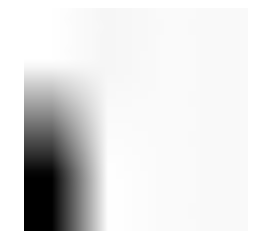

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 53.70%


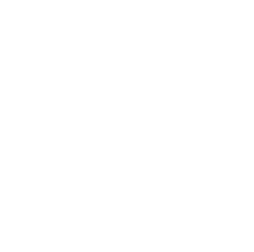

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 26.07%


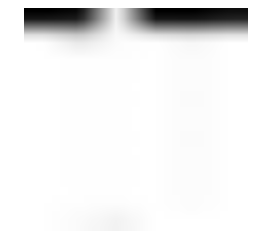

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 94.53%


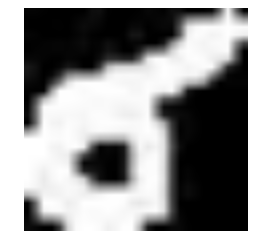

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


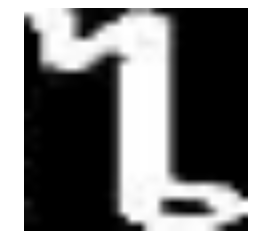

ตำแหน่ง :  193
ทำนาย :  ไ
ค่าความมั่นใจ : 100.00%


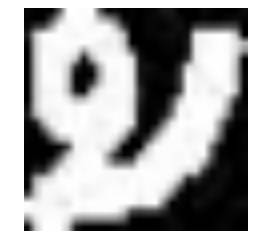

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


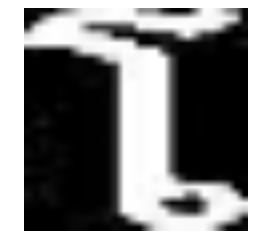

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


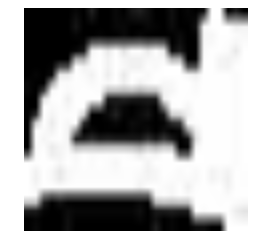

ตำแหน่ง :  178
ทำนาย :  อี(สระอี)
ค่าความมั่นใจ : 100.00%


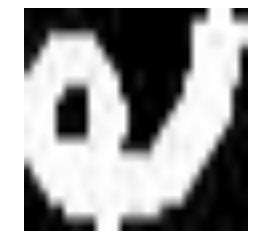

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


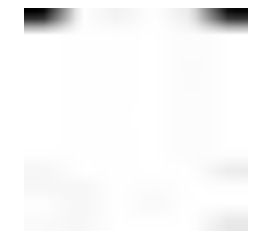

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 91.08%


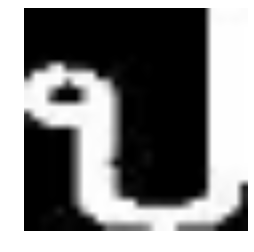

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


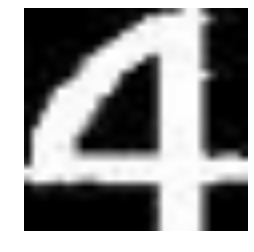

ตำแหน่ง :  17
ทำนาย :  4
ค่าความมั่นใจ : 100.00%


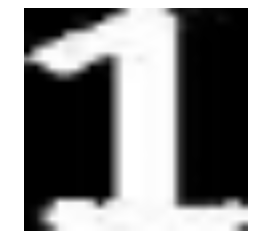

ตำแหน่ง :  14
ทำนาย :  1
ค่าความมั่นใจ : 100.00%


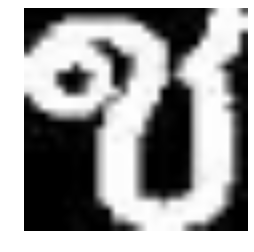

ตำแหน่ง :  127
ทำนาย :  ข
ค่าความมั่นใจ : 100.00%


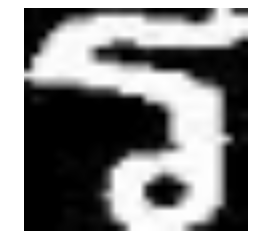

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


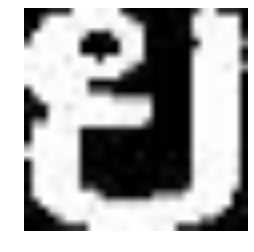

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


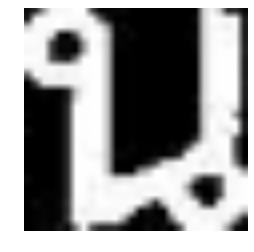

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


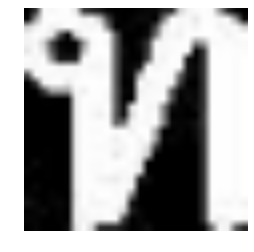

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


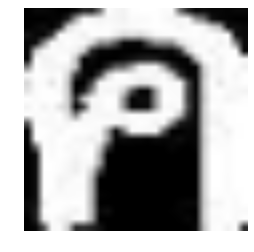

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


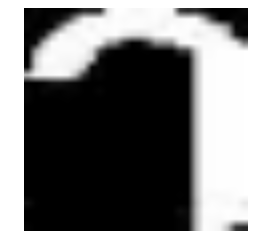

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


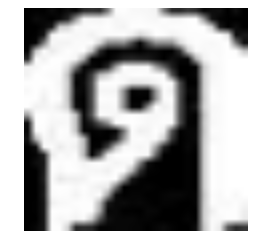

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


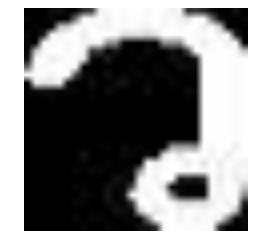

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


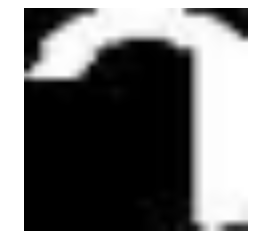

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


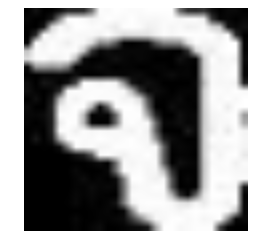

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


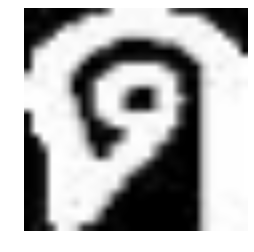

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


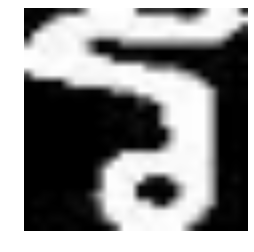

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


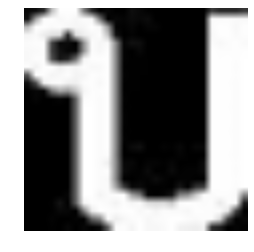

ตำแหน่ง :  151
ทำนาย :  บ
ค่าความมั่นใจ : 100.00%


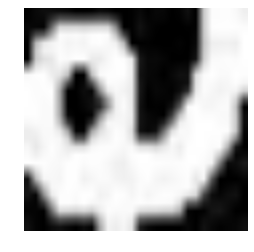

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


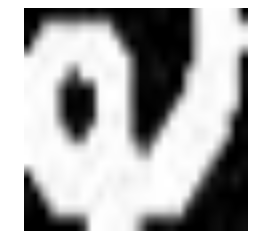

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


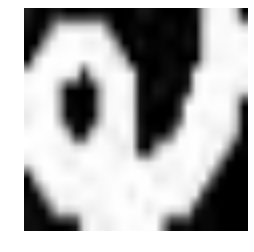

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


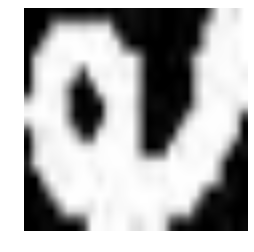

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


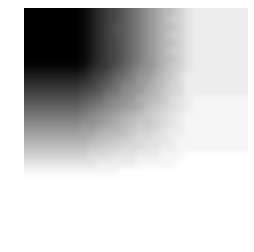

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 46.73%


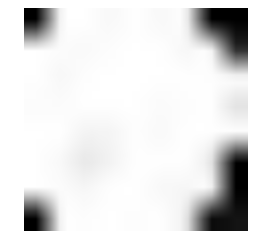

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 94.60%


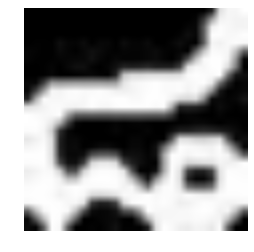

ตำแหน่ง :  213
ทำนาย :  ๘
ค่าความมั่นใจ : 97.97%


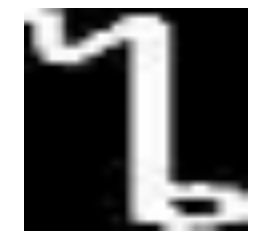

ตำแหน่ง :  193
ทำนาย :  ไ
ค่าความมั่นใจ : 100.00%


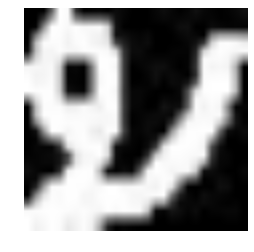

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


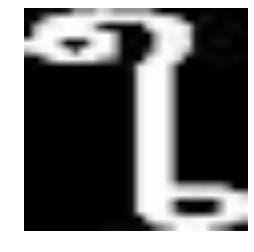

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


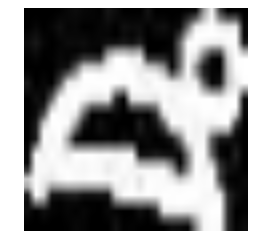

ตำแหน่ง :  179
ทำนาย :  อึ(สระอึ)
ค่าความมั่นใจ : 100.00%


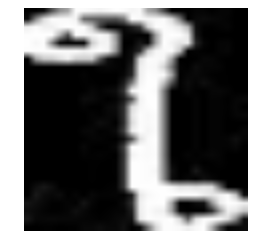

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


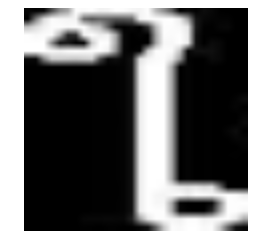

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


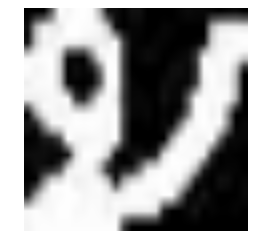

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


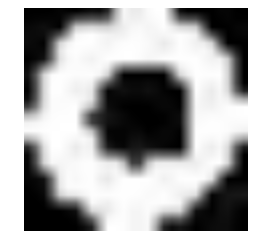

ตำแหน่ง :  202
ทำนาย :  อำ
ค่าความมั่นใจ : 95.05%


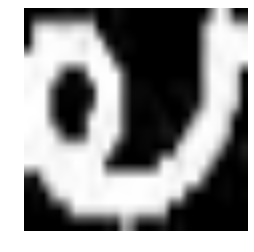

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


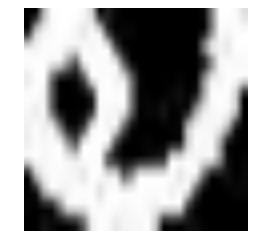

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


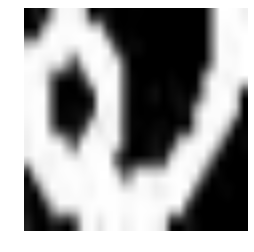

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


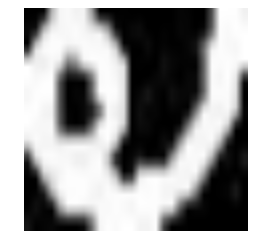

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


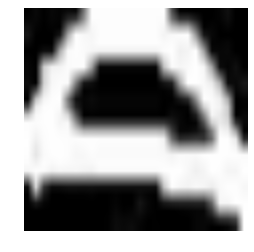

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


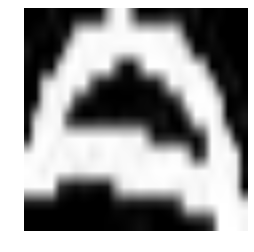

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


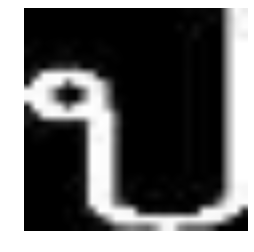

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


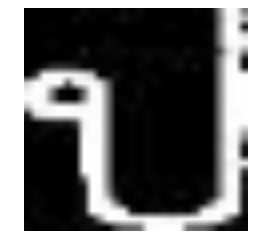

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


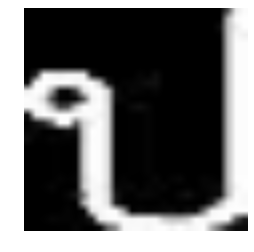

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


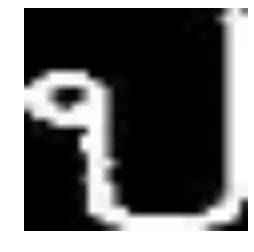

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


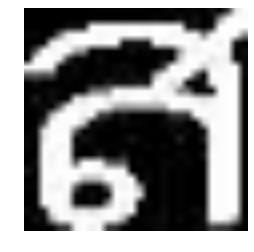

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


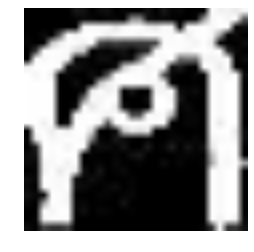

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 99.95%


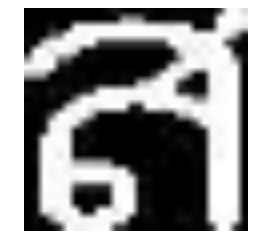

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


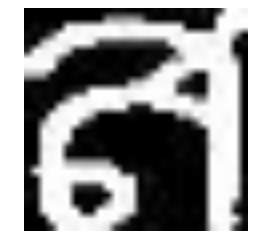

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


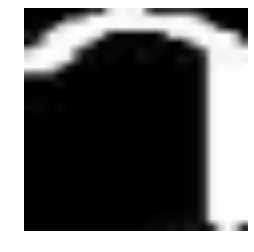

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


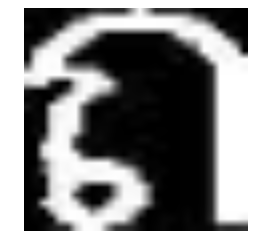

ตำแหน่ง :  147
ทำนาย :  ถ
ค่าความมั่นใจ : 100.00%


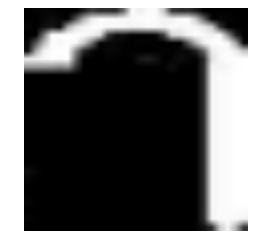

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


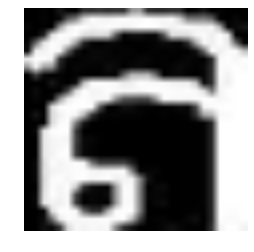

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


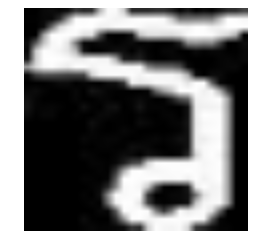

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


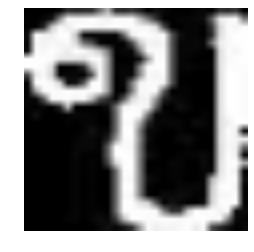

ตำแหน่ง :  127
ทำนาย :  ข
ค่าความมั่นใจ : 100.00%


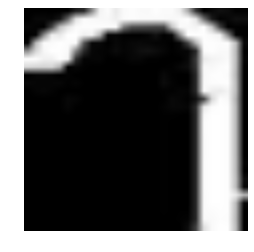

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


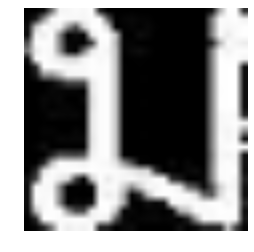

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


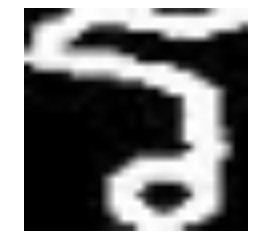

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


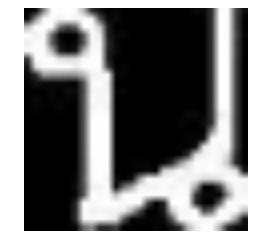

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


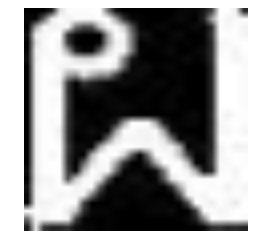

ตำแหน่ง :  153
ทำนาย :  ผ
ค่าความมั่นใจ : 100.00%


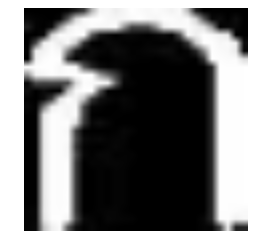

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


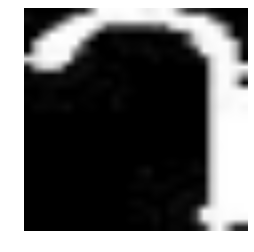

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


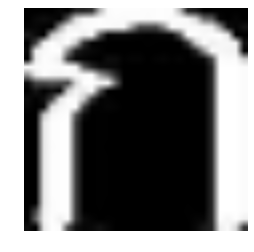

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


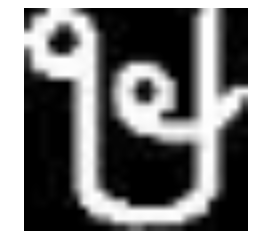

ตำแหน่ง :  166
ทำนาย :  ษ
ค่าความมั่นใจ : 100.00%


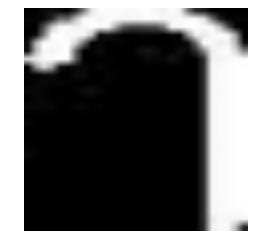

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


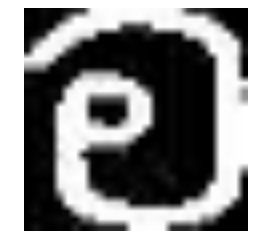

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


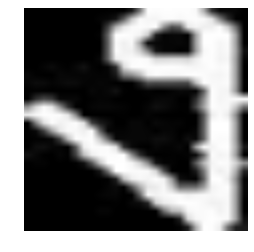

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


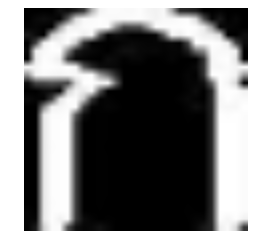

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


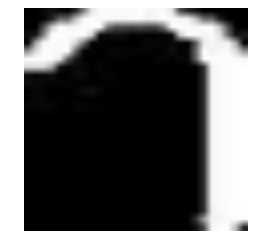

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


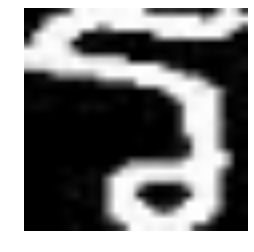

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


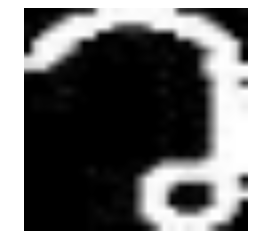

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


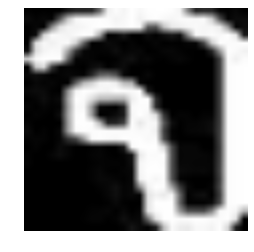

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


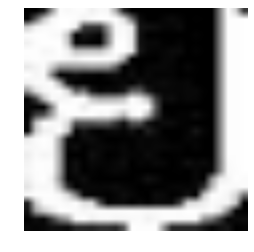

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


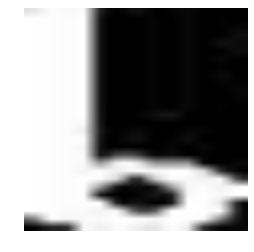

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


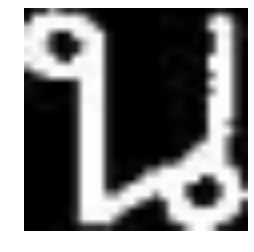

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


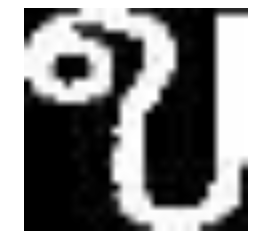

ตำแหน่ง :  127
ทำนาย :  ข
ค่าความมั่นใจ : 100.00%


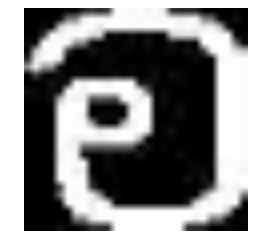

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


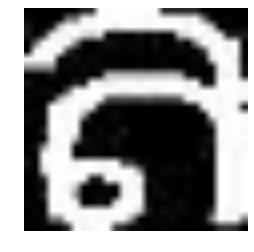

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


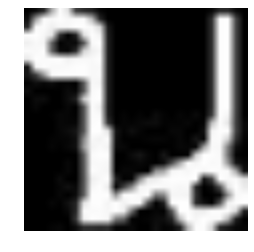

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


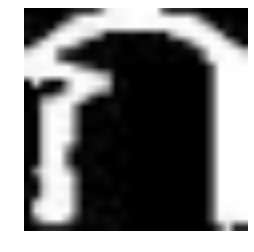

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


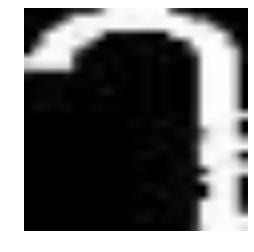

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


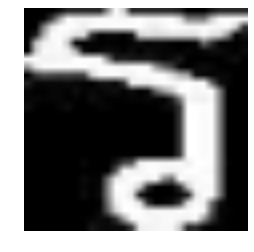

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


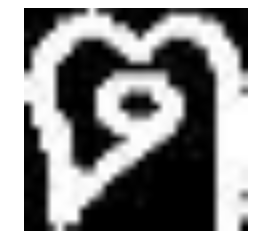

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


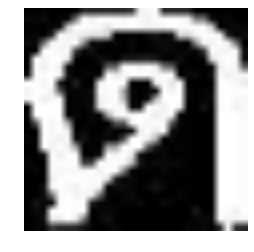

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


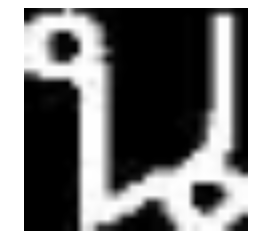

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


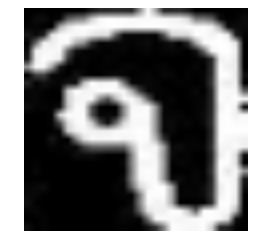

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


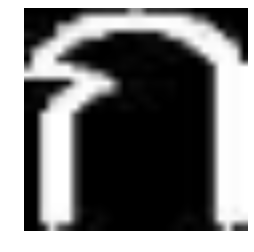

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


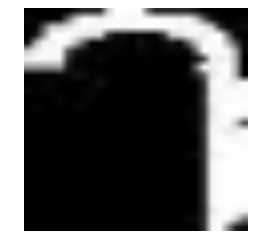

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


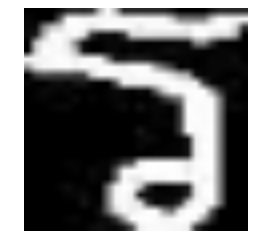

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


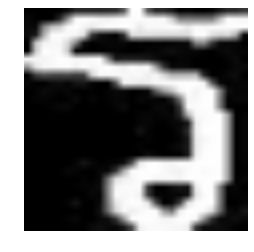

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


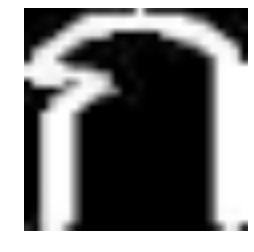

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


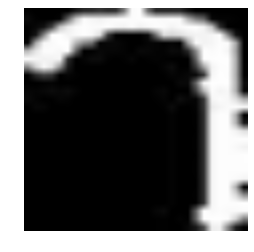

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


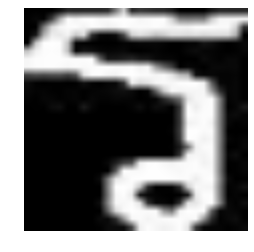

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


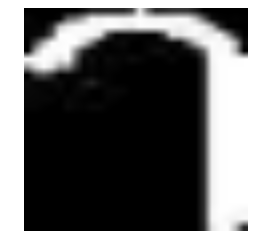

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


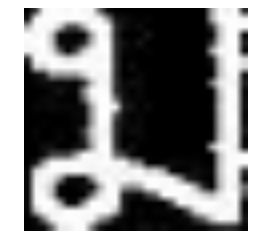

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


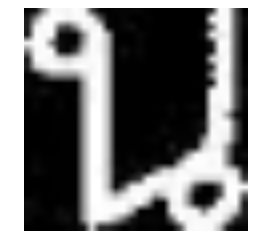

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


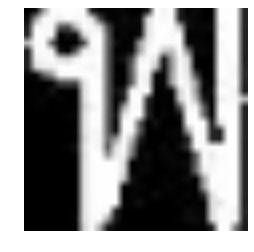

ตำแหน่ง :  155
ทำนาย :  พ
ค่าความมั่นใจ : 100.00%


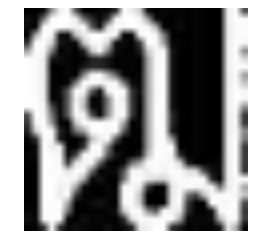

ตำแหน่ง :  143
ทำนาย :  ฒ
ค่าความมั่นใจ : 100.00%


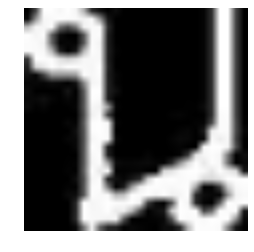

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


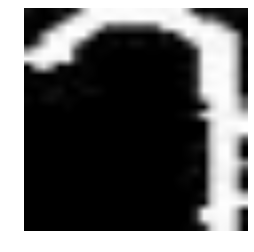

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.97%


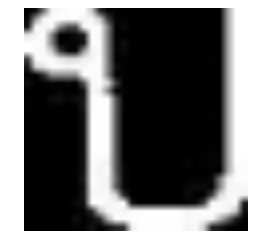

ตำแหน่ง :  151
ทำนาย :  บ
ค่าความมั่นใจ : 100.00%


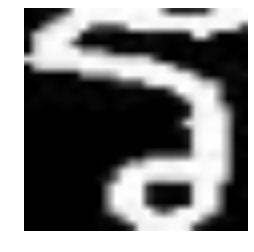

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


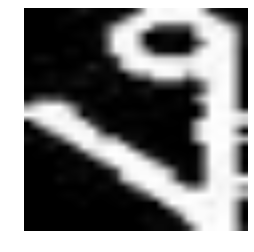

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


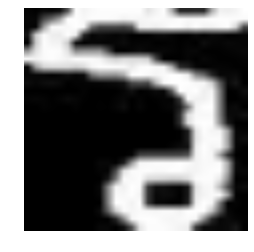

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


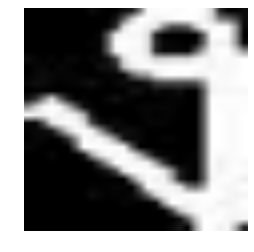

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


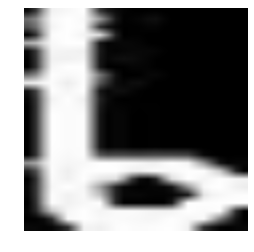

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


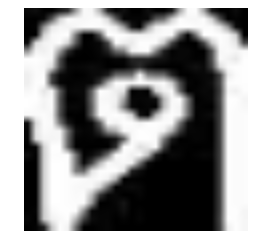

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


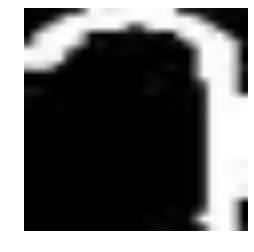

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


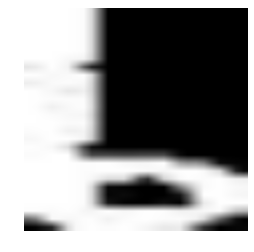

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


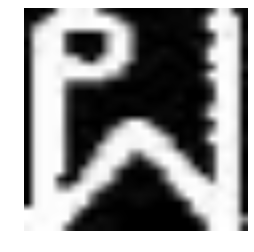

ตำแหน่ง :  153
ทำนาย :  ผ
ค่าความมั่นใจ : 100.00%


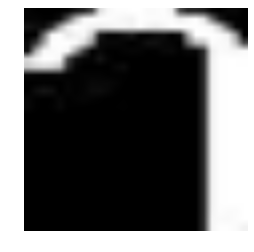

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


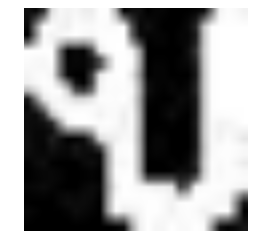

ตำแหน่ง :  182
ทำนาย :  อู(สระอู)
ค่าความมั่นใจ : 100.00%


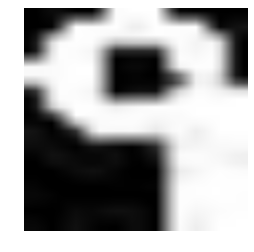

ตำแหน่ง :  181
ทำนาย :  อุ(สระอุ)
ค่าความมั่นใจ : 100.00%


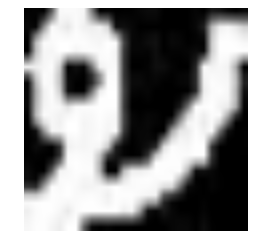

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


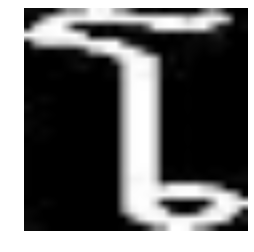

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


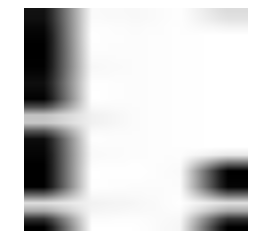

ตำแหน่ง :  70
ทำนาย :  i
ค่าความมั่นใจ : 50.87%


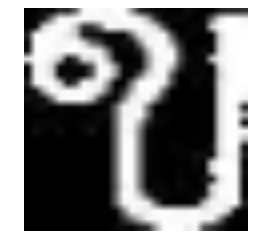

ตำแหน่ง :  127
ทำนาย :  ข
ค่าความมั่นใจ : 100.00%


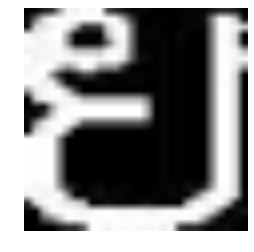

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


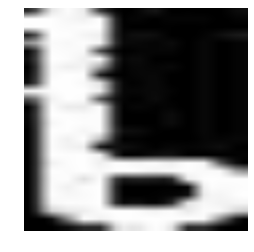

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


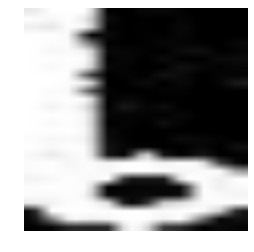

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


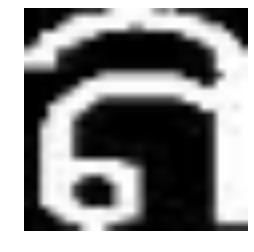

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


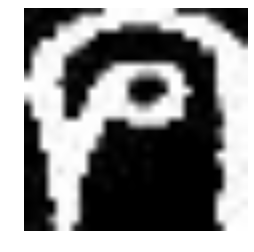

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


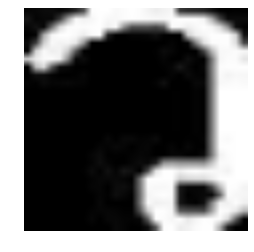

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


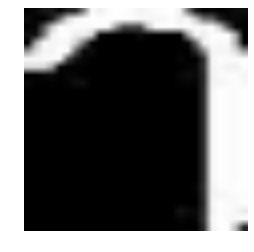

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


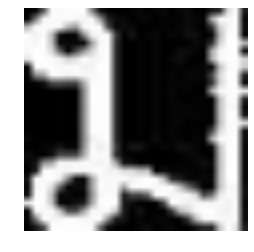

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


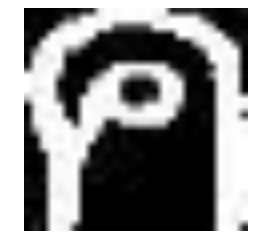

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


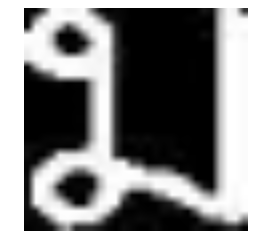

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


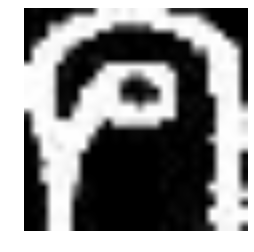

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


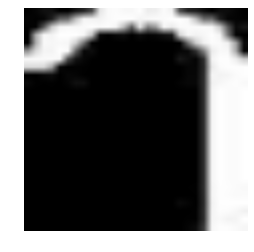

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


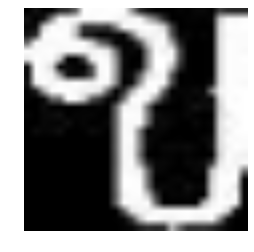

ตำแหน่ง :  127
ทำนาย :  ข
ค่าความมั่นใจ : 100.00%


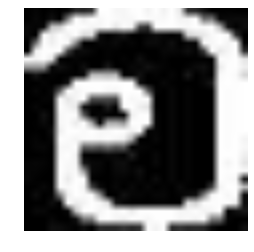

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


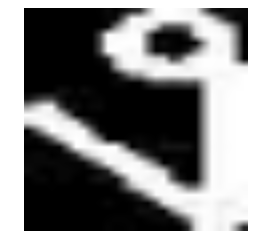

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


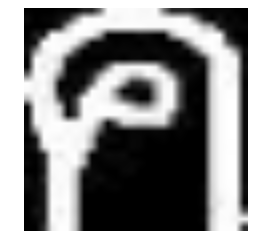

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


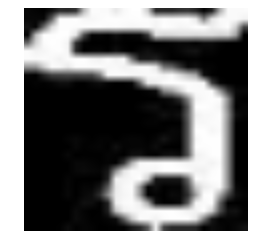

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


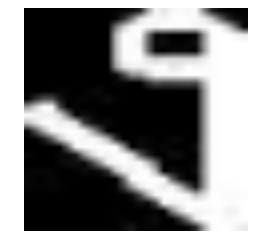

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


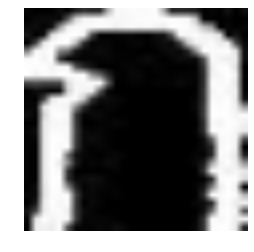

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


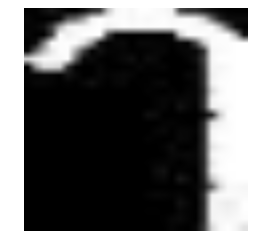

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


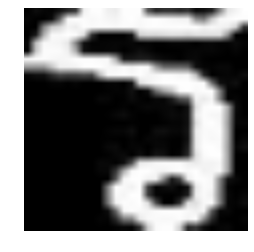

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


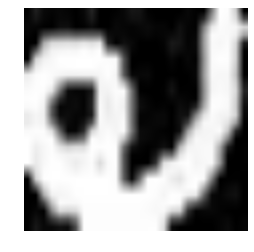

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.91%


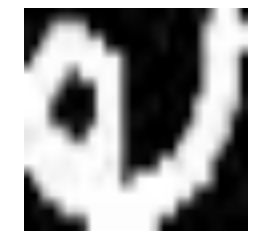

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


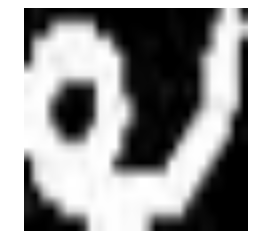

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 80.12%


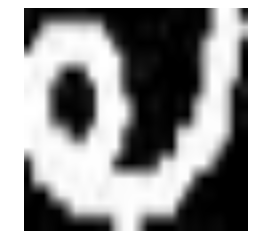

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.84%


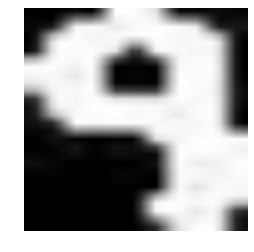

ตำแหน่ง :  181
ทำนาย :  อุ(สระอุ)
ค่าความมั่นใจ : 100.00%


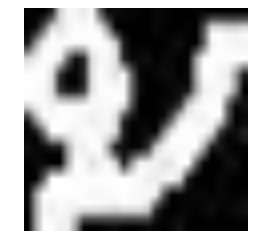

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


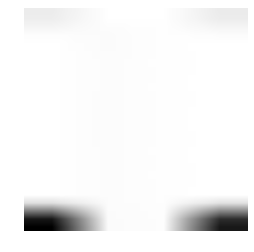

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 96.16%


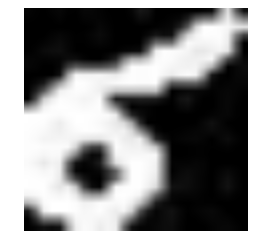

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


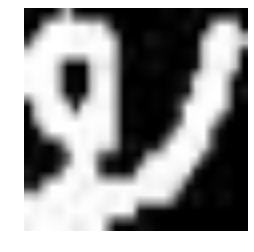

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


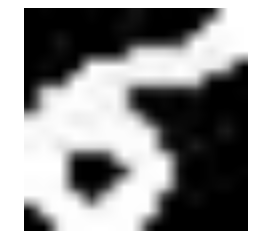

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


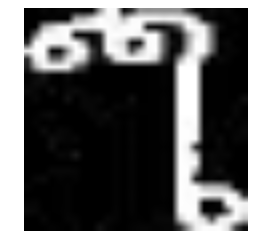

ตำแหน่ง :  241
ทำนาย :  อ์ใ(ติด)
ค่าความมั่นใจ : 100.00%


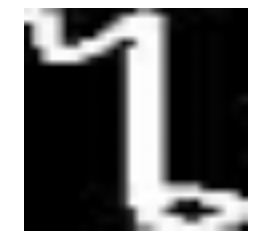

ตำแหน่ง :  193
ทำนาย :  ไ
ค่าความมั่นใจ : 100.00%


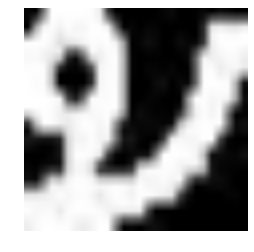

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


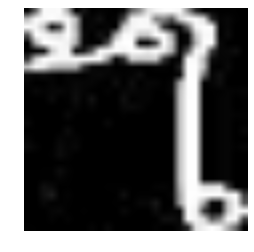

ตำแหน่ง :  238
ทำนาย :  อ้ใ(ติด)
ค่าความมั่นใจ : 100.00%


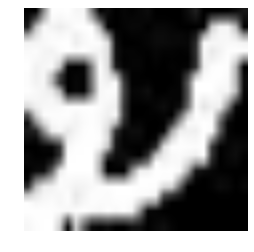

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


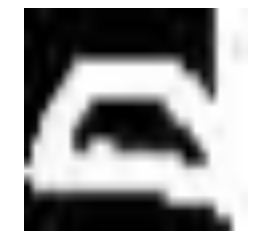

ตำแหน่ง :  178
ทำนาย :  อี(สระอี)
ค่าความมั่นใจ : 100.00%


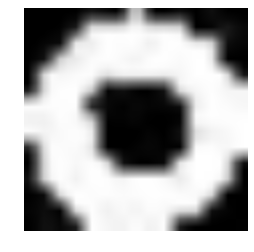

ตำแหน่ง :  202
ทำนาย :  อำ
ค่าความมั่นใจ : 100.00%


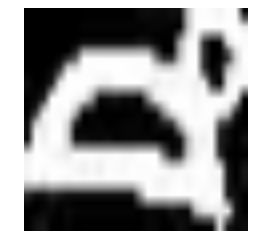

ตำแหน่ง :  179
ทำนาย :  อึ(สระอึ)
ค่าความมั่นใจ : 100.00%


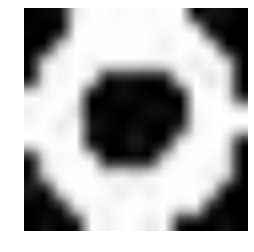

ตำแหน่ง :  205
ทำนาย :  ๐(ศูนย์ไทย)
ค่าความมั่นใจ : 81.98%


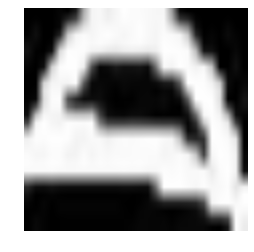

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


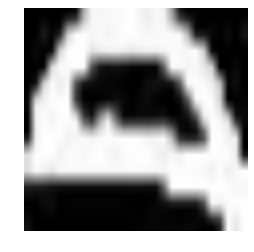

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


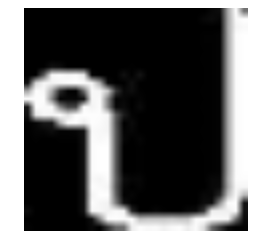

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


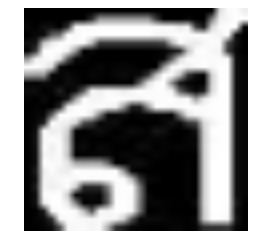

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


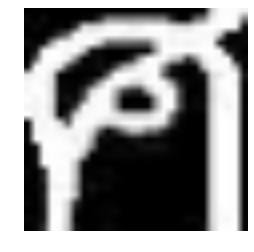

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 100.00%


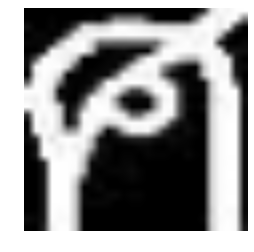

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 100.00%


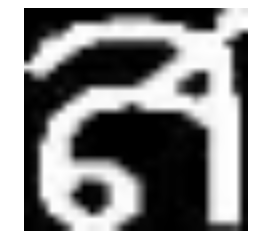

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


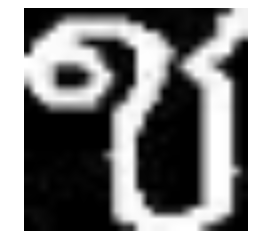

ตำแหน่ง :  135
ทำนาย :  ช
ค่าความมั่นใจ : 99.03%


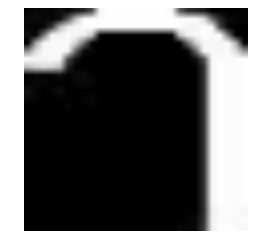

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


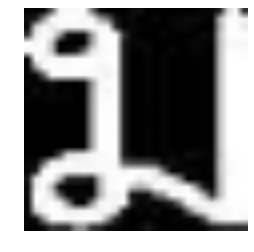

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


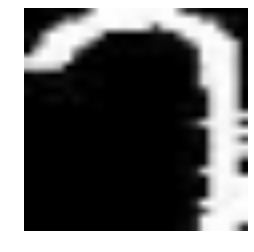

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


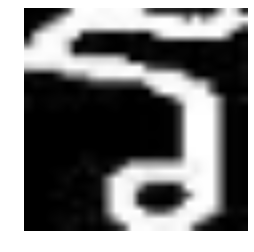

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


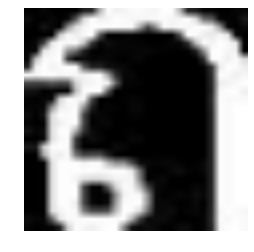

ตำแหน่ง :  147
ทำนาย :  ถ
ค่าความมั่นใจ : 100.00%


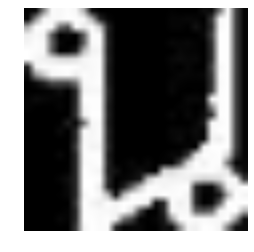

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


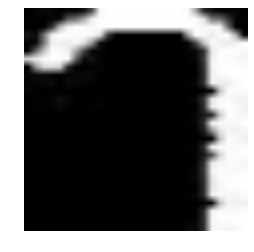

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.95%


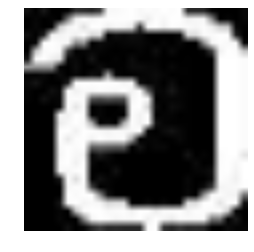

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


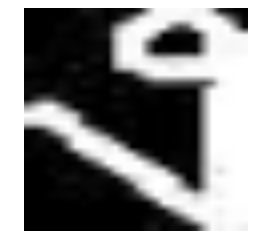

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


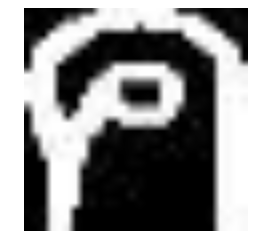

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


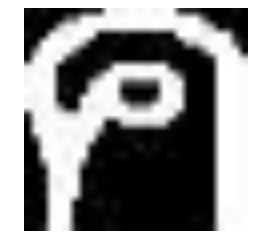

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


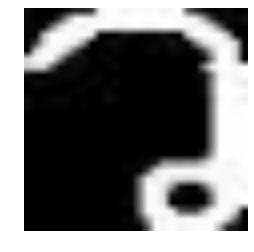

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


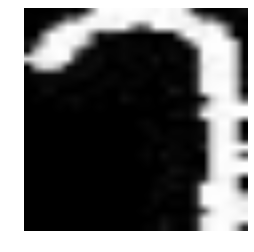

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


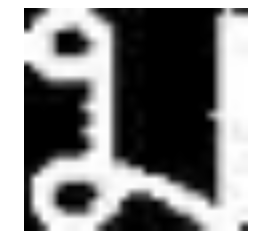

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


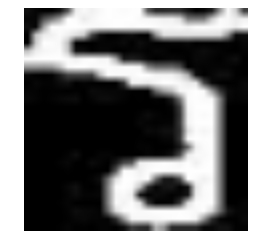

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


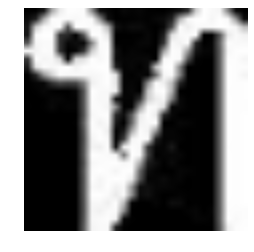

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 99.99%


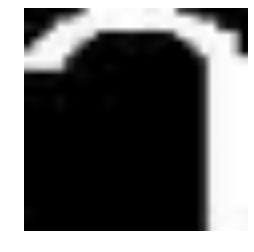

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


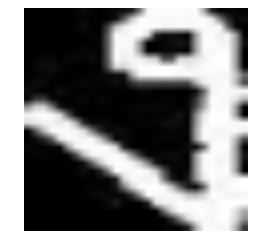

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


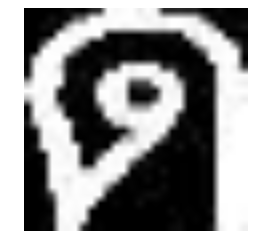

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


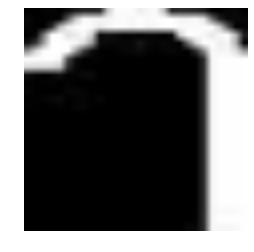

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


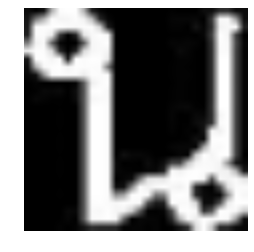

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


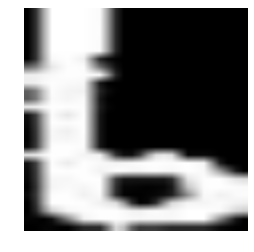

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


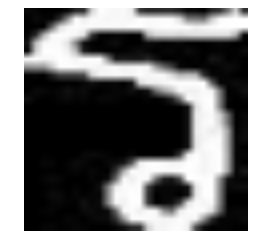

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


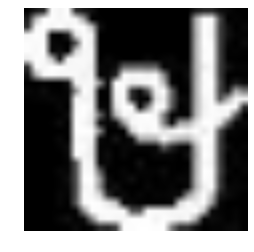

ตำแหน่ง :  166
ทำนาย :  ษ
ค่าความมั่นใจ : 100.00%


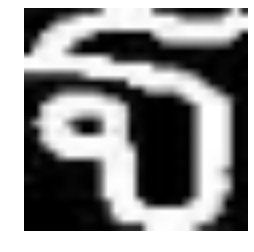

ตำแหน่ง :  141
ทำนาย :  ฐ
ค่าความมั่นใจ : 100.00%


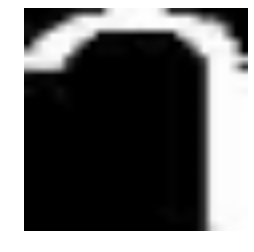

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


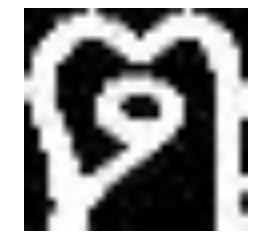

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


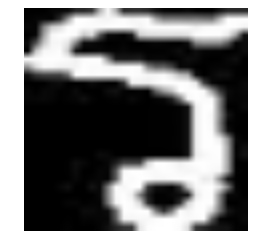

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


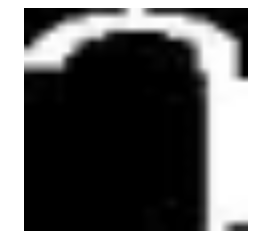

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.99%


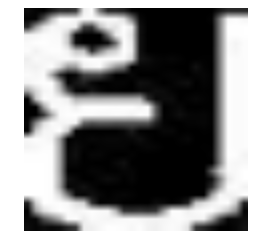

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


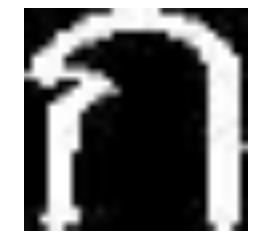

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


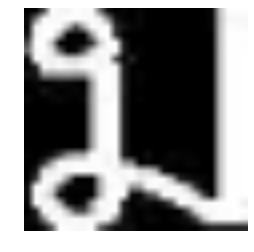

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


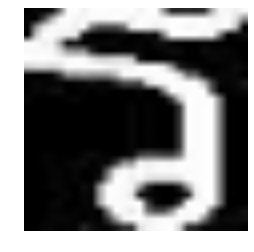

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


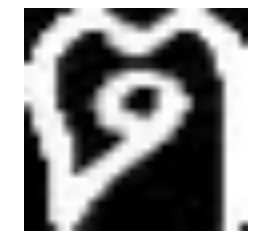

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


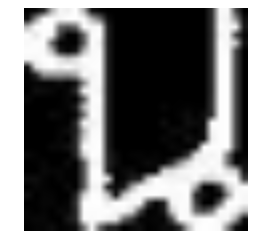

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


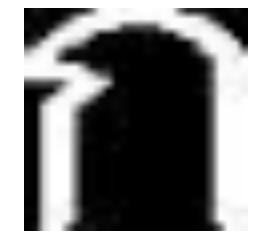

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


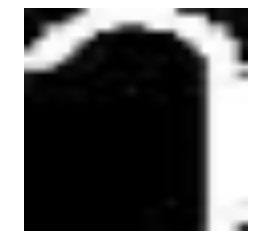

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


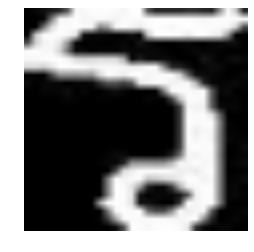

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


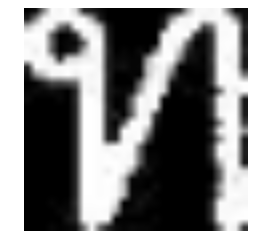

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


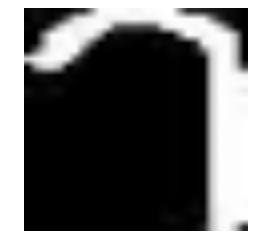

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


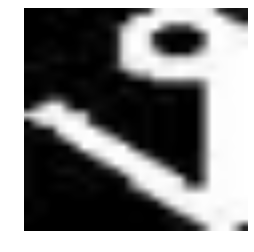

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


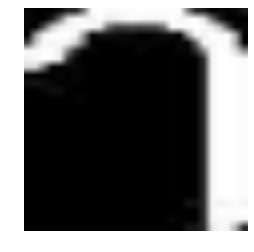

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


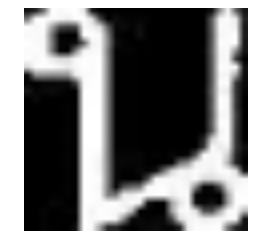

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


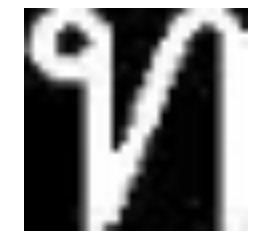

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


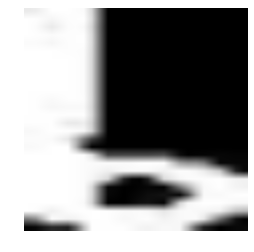

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


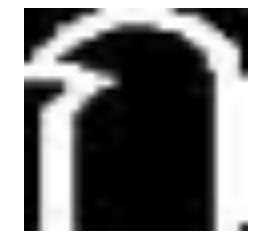

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


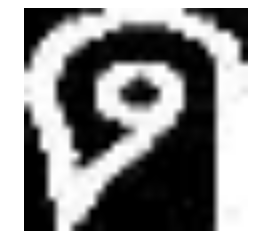

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


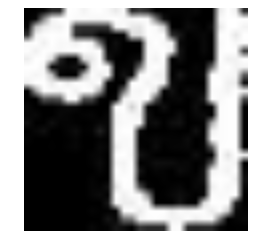

ตำแหน่ง :  127
ทำนาย :  ข
ค่าความมั่นใจ : 100.00%


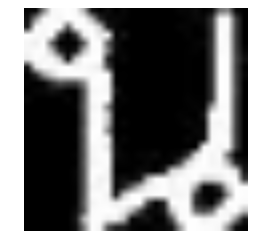

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


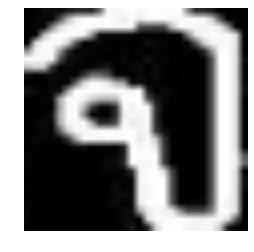

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


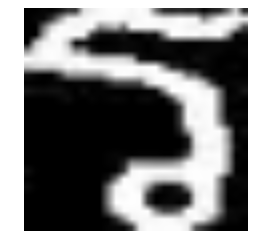

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


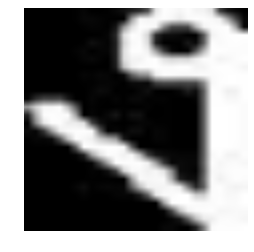

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


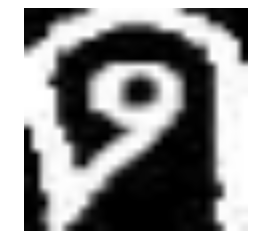

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


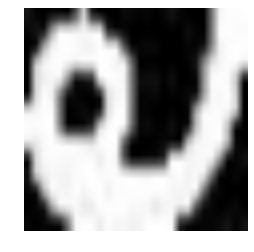

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.99%


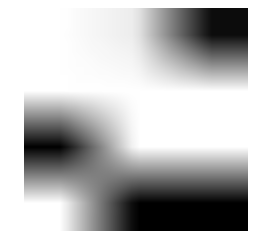

ตำแหน่ง :  4
ทำนาย :  (single quote)
ค่าความมั่นใจ : 60.62%


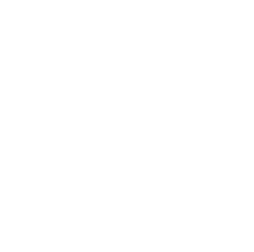

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 25.30%


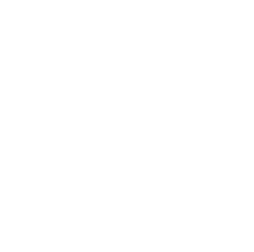

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 32.58%


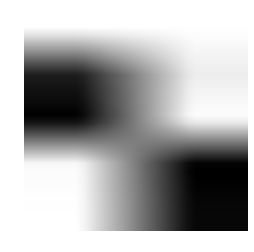

ตำแหน่ง :  9
ทำนาย :  ,
ค่าความมั่นใจ : 83.00%


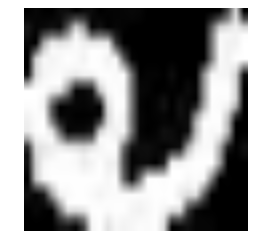

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.85%


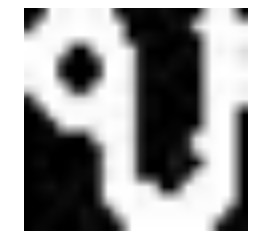

ตำแหน่ง :  182
ทำนาย :  อู(สระอู)
ค่าความมั่นใจ : 100.00%


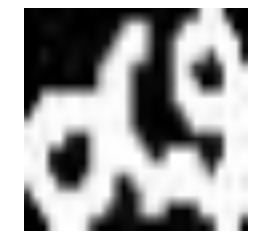

ตำแหน่ง :  179
ทำนาย :  อึ(สระอึ)
ค่าความมั่นใจ : 99.41%


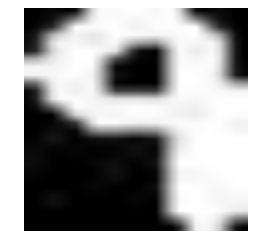

ตำแหน่ง :  181
ทำนาย :  อุ(สระอุ)
ค่าความมั่นใจ : 100.00%


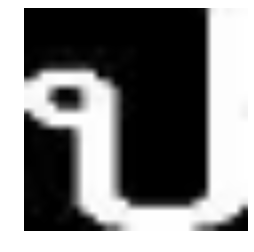

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


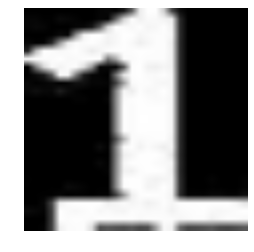

ตำแหน่ง :  14
ทำนาย :  1
ค่าความมั่นใจ : 100.00%


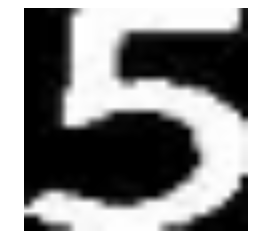

ตำแหน่ง :  18
ทำนาย :  5
ค่าความมั่นใจ : 100.00%


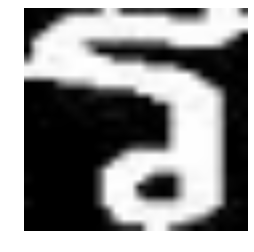

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


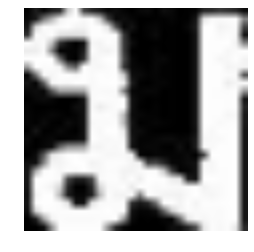

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


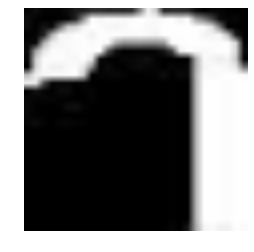

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


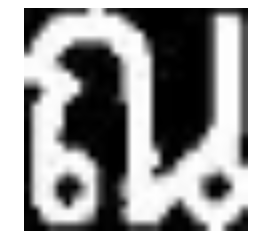

ตำแหน่ง :  144
ทำนาย :  ณ
ค่าความมั่นใจ : 100.00%


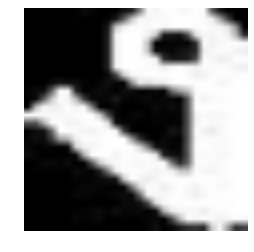

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


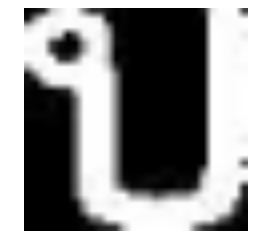

ตำแหน่ง :  151
ทำนาย :  บ
ค่าความมั่นใจ : 100.00%


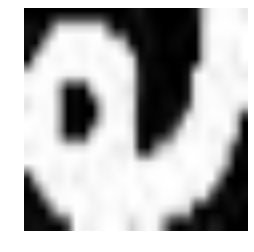

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


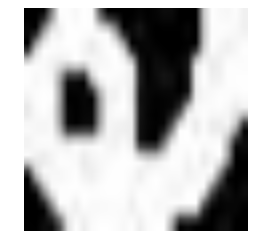

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


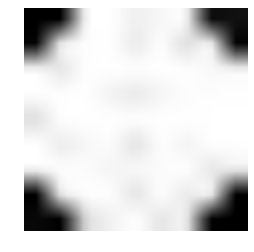

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 91.35%


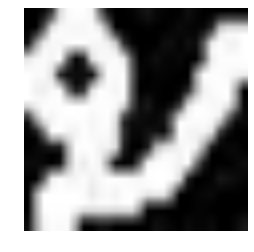

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


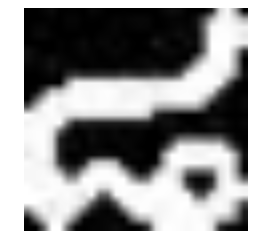

ตำแหน่ง :  213
ทำนาย :  ๘
ค่าความมั่นใจ : 100.00%


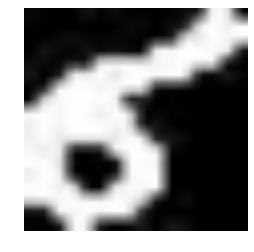

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


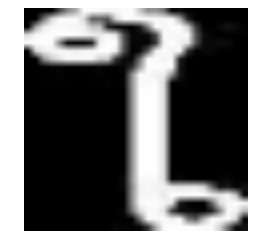

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


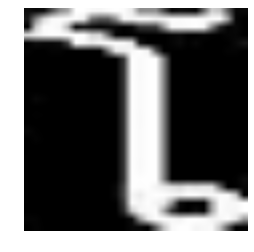

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


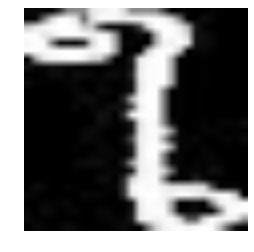

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


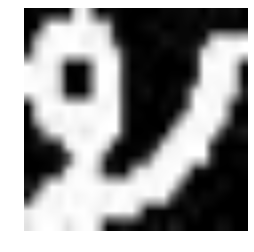

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


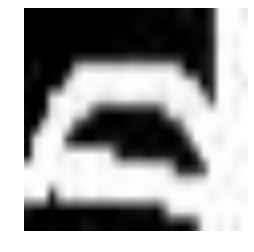

ตำแหน่ง :  178
ทำนาย :  อี(สระอี)
ค่าความมั่นใจ : 100.00%


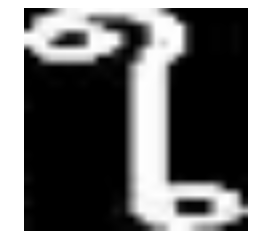

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


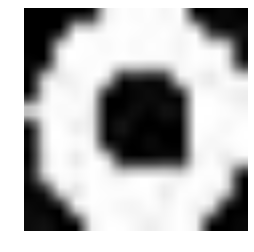

ตำแหน่ง :  202
ทำนาย :  อำ
ค่าความมั่นใจ : 99.99%


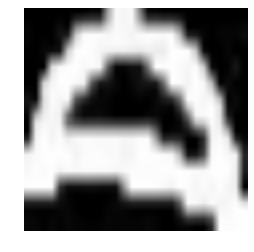

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


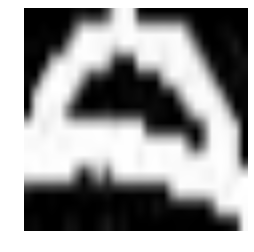

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


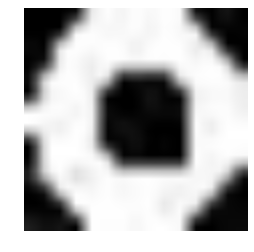

ตำแหน่ง :  202
ทำนาย :  อำ
ค่าความมั่นใจ : 100.00%


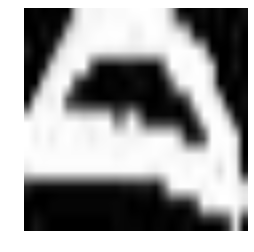

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


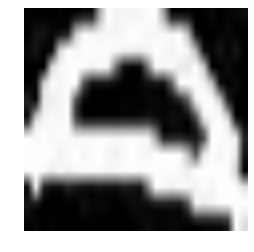

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


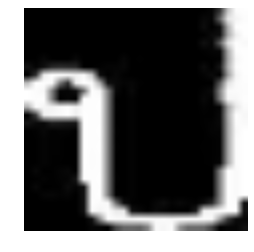

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


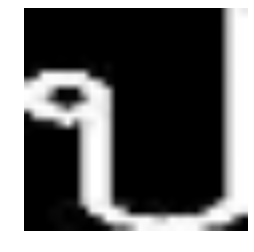

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


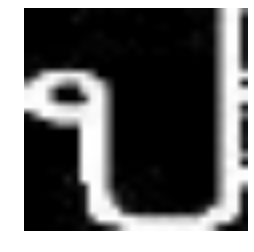

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


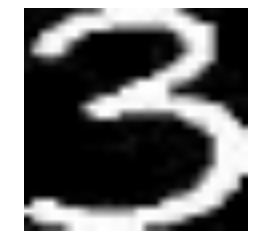

ตำแหน่ง :  16
ทำนาย :  3
ค่าความมั่นใจ : 100.00%


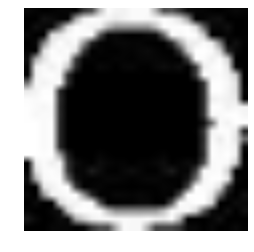

ตำแหน่ง :  13
ทำนาย :  0
ค่าความมั่นใจ : 55.53%


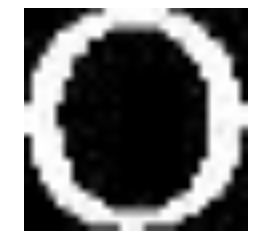

ตำแหน่ง :  44
ทำนาย :  O
ค่าความมั่นใจ : 74.59%


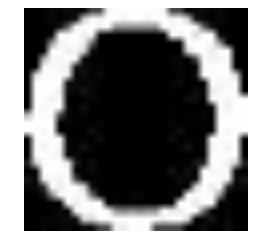

ตำแหน่ง :  44
ทำนาย :  O
ค่าความมั่นใจ : 65.84%


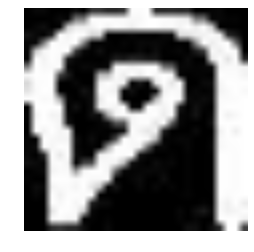

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


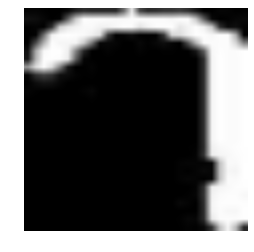

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


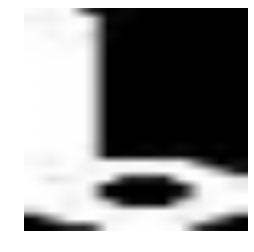

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


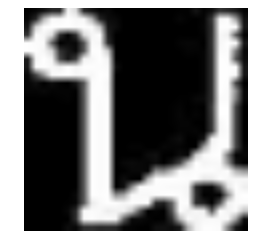

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


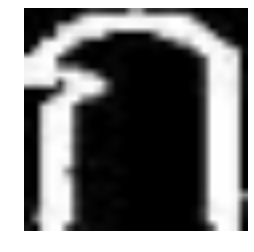

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


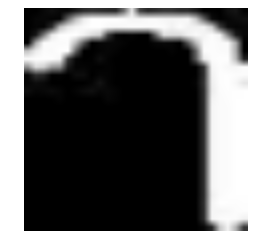

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


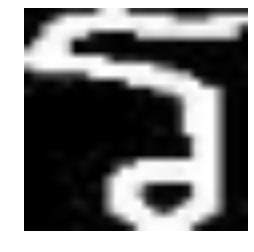

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


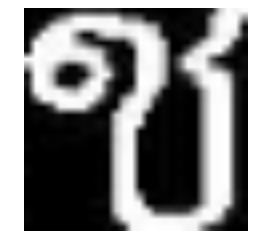

ตำแหน่ง :  135
ทำนาย :  ช
ค่าความมั่นใจ : 99.39%


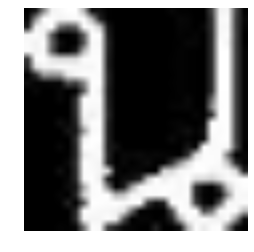

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


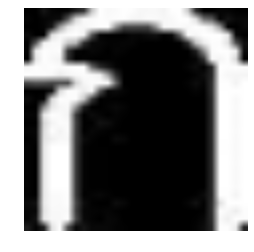

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


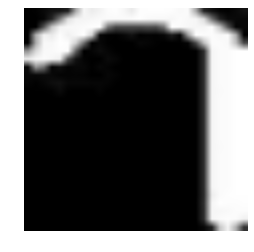

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


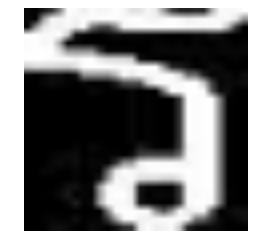

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


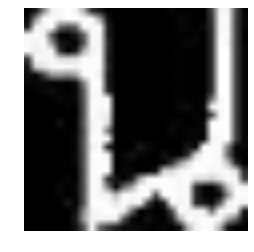

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


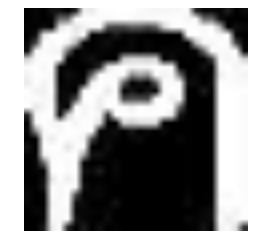

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


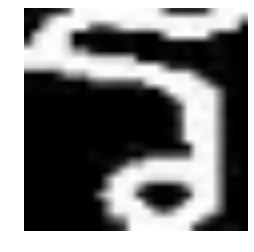

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


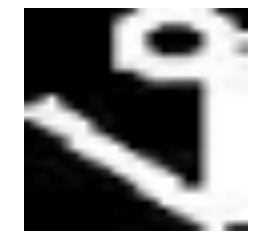

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


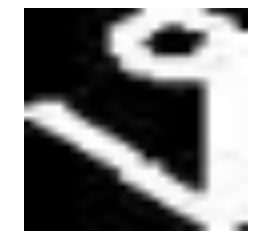

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


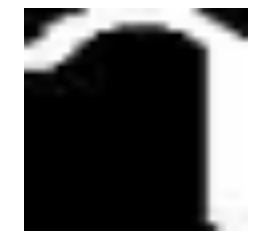

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


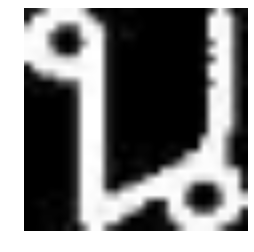

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


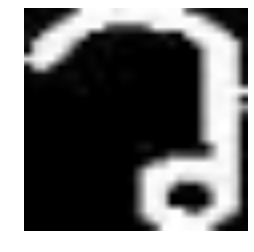

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


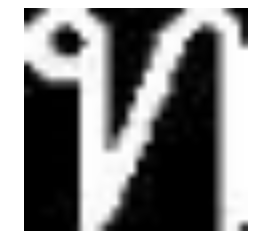

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


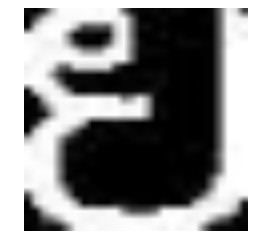

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


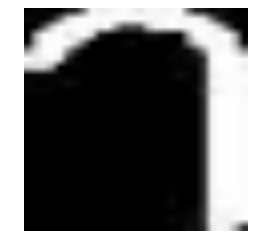

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


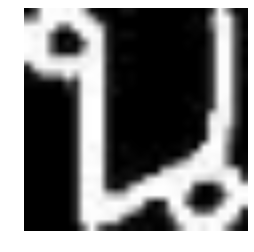

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


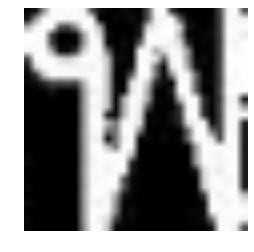

ตำแหน่ง :  155
ทำนาย :  พ
ค่าความมั่นใจ : 100.00%


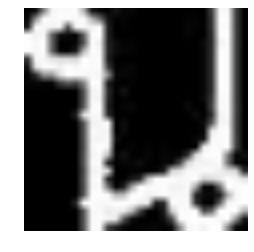

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


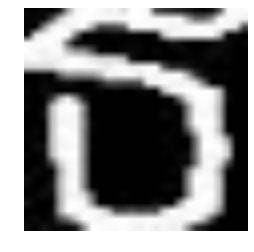

ตำแหน่ง :  149
ทำนาย :  ธ
ค่าความมั่นใจ : 100.00%


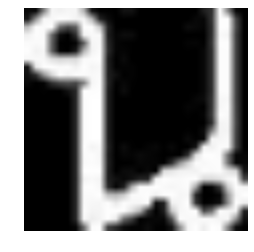

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


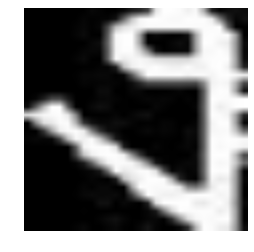

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


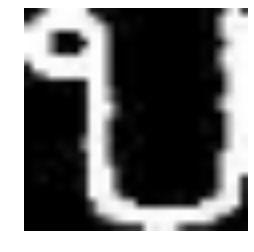

ตำแหน่ง :  151
ทำนาย :  บ
ค่าความมั่นใจ : 100.00%


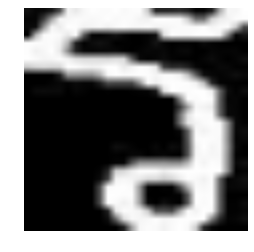

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


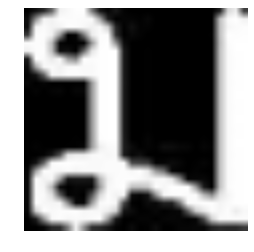

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


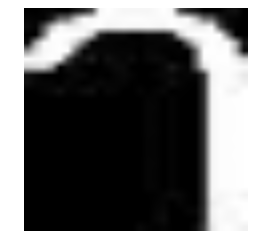

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


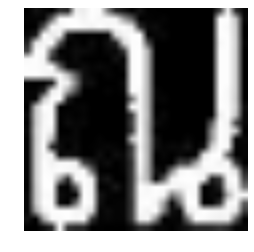

ตำแหน่ง :  144
ทำนาย :  ณ
ค่าความมั่นใจ : 100.00%


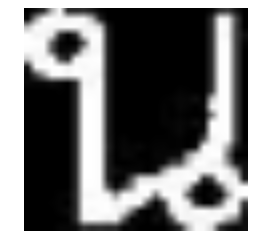

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


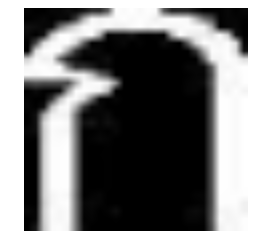

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


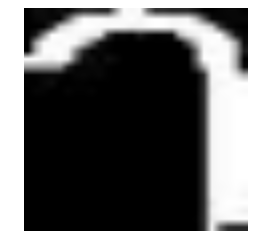

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.97%


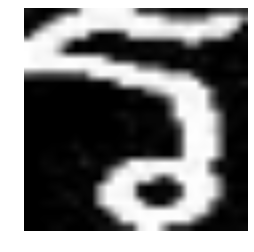

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


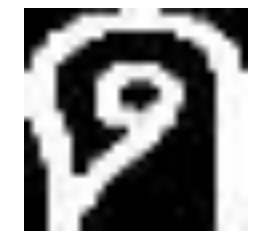

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


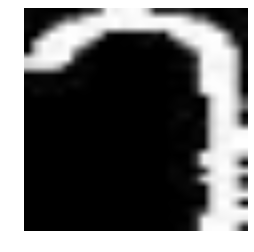

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


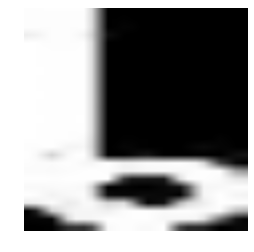

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


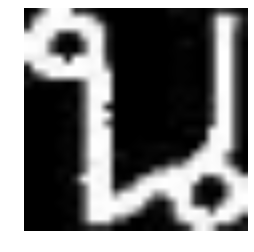

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


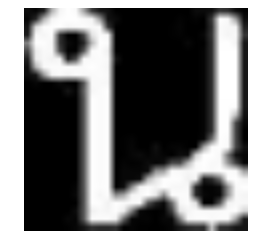

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


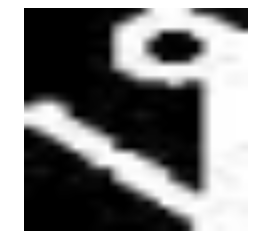

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


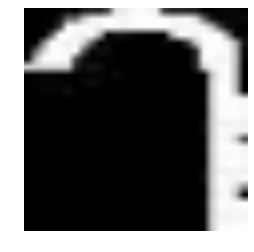

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


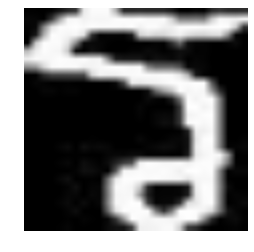

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


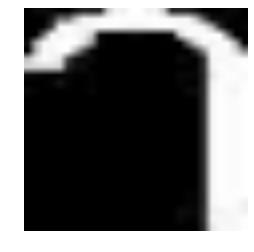

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


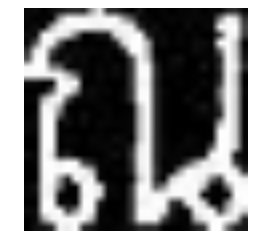

ตำแหน่ง :  144
ทำนาย :  ณ
ค่าความมั่นใจ : 100.00%


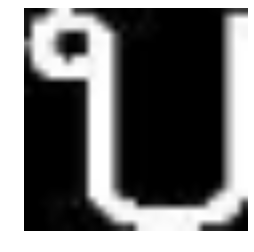

ตำแหน่ง :  151
ทำนาย :  บ
ค่าความมั่นใจ : 100.00%


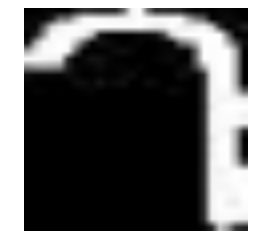

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


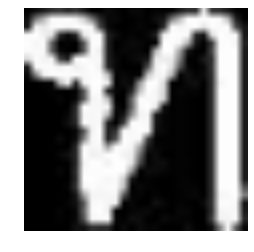

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


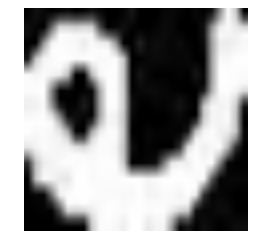

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


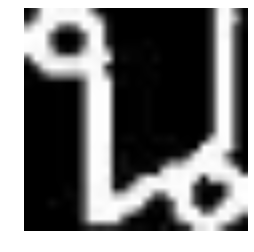

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


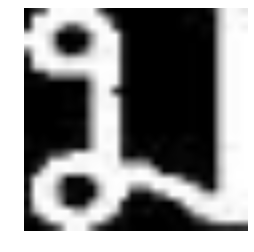

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


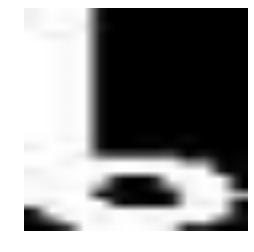

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


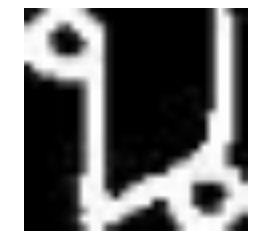

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


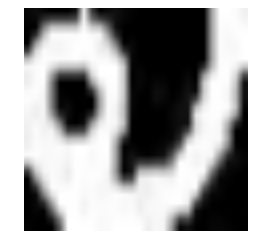

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.99%


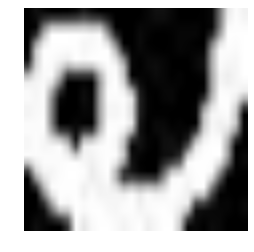

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.34%


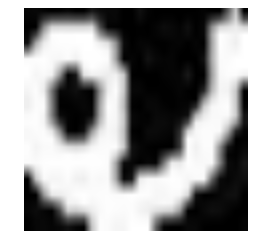

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


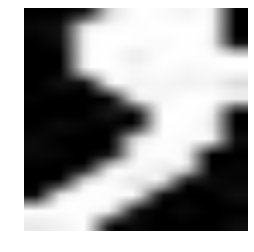

ตำแหน่ง :  4
ทำนาย :  (single quote)
ค่าความมั่นใจ : 66.19%


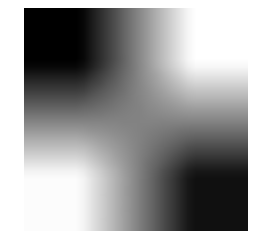

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 34.39%


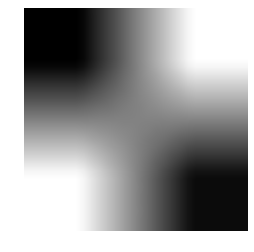

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 32.05%


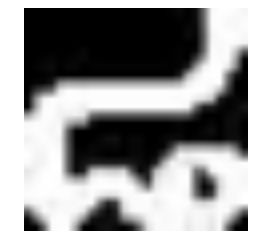

ตำแหน่ง :  213
ทำนาย :  ๘
ค่าความมั่นใจ : 99.99%


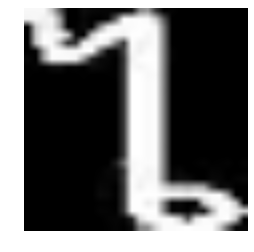

ตำแหน่ง :  193
ทำนาย :  ไ
ค่าความมั่นใจ : 100.00%


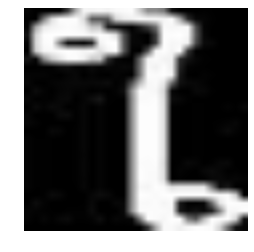

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


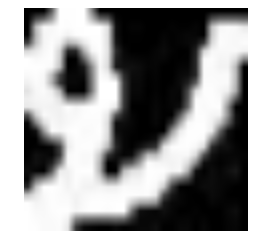

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


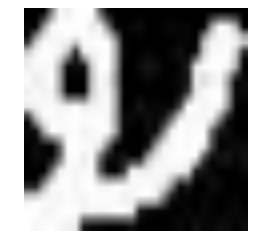

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


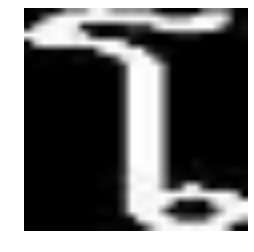

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


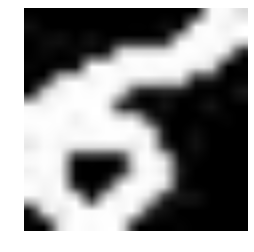

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


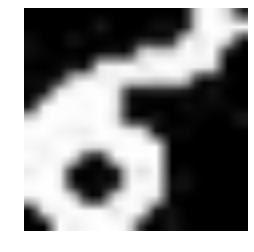

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


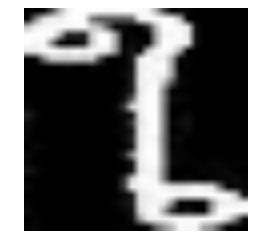

ตำแหน่ง :  192
ทำนาย :  ใ
ค่าความมั่นใจ : 100.00%


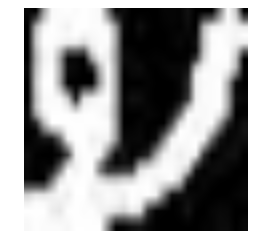

ตำแหน่ง :  198
ทำนาย :  อ้(ไม้โท)
ค่าความมั่นใจ : 100.00%


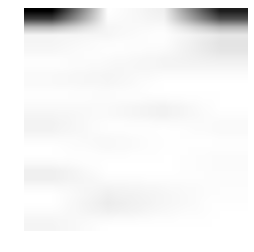

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 45.68%


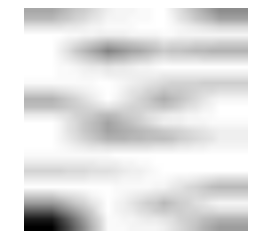

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 28.59%


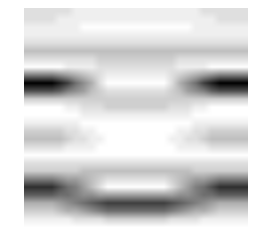

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 25.29%


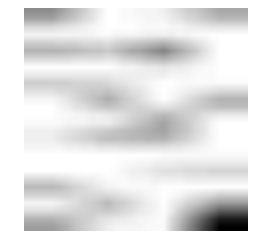

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 27.91%


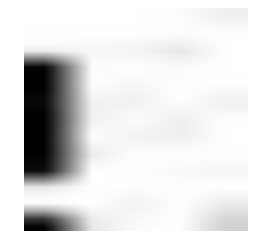

ตำแหน่ง :  70
ทำนาย :  i
ค่าความมั่นใจ : 43.69%


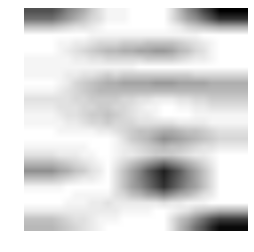

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 25.35%


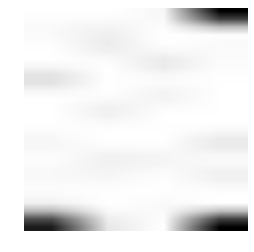

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 67.06%


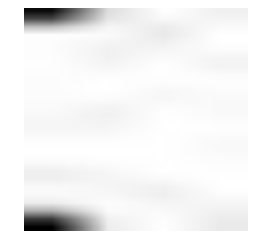

ตำแหน่ง :  197
ทำนาย :  อ่(ไม้เอก)
ค่าความมั่นใจ : 86.21%


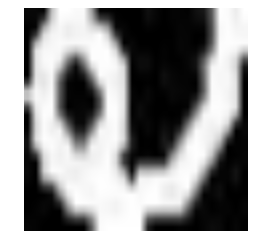

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


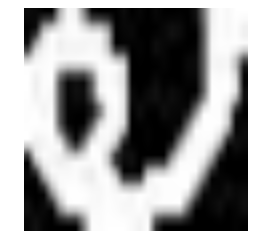

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


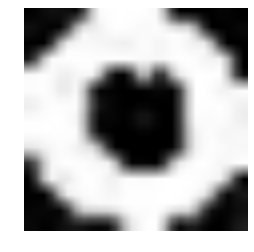

ตำแหน่ง :  202
ทำนาย :  อำ
ค่าความมั่นใจ : 99.94%


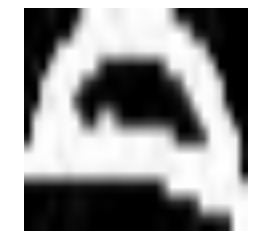

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


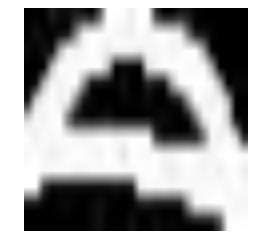

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


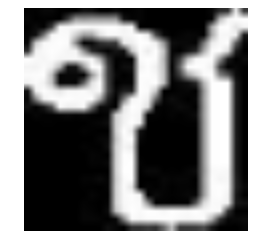

ตำแหน่ง :  135
ทำนาย :  ช
ค่าความมั่นใจ : 99.67%


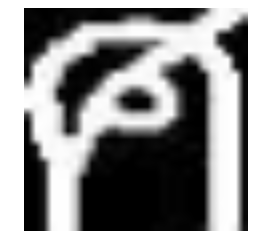

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 100.00%


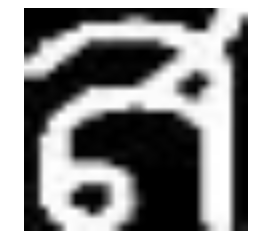

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


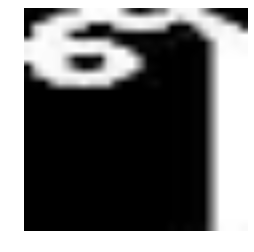

ตำแหน่ง :  195
ทำนาย :  ๆ
ค่าความมั่นใจ : 100.00%


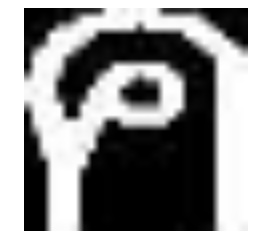

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


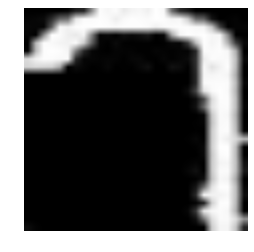

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


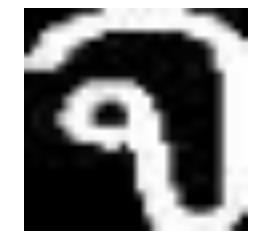

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


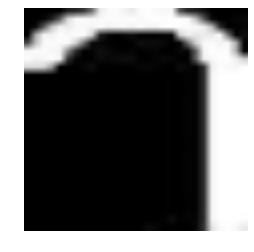

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


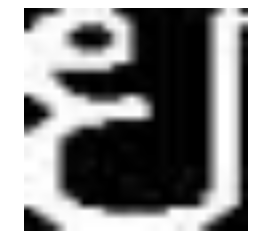

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


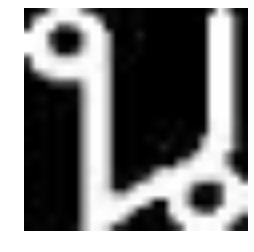

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


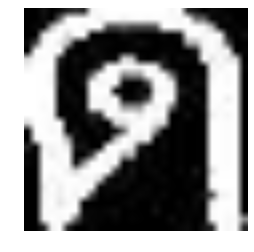

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


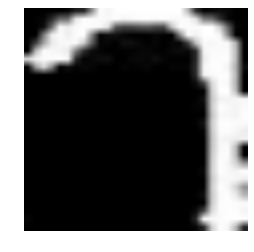

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.99%


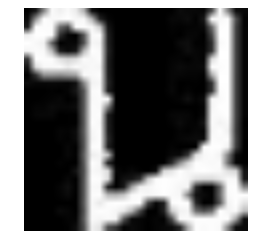

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


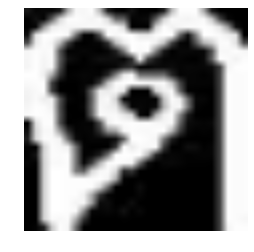

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


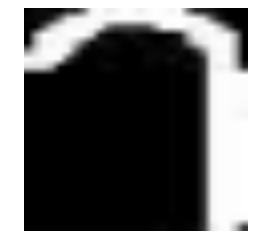

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


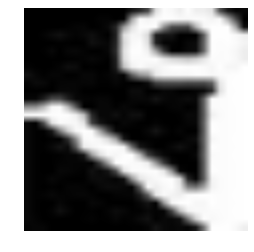

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


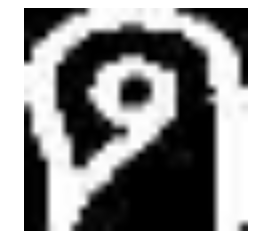

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


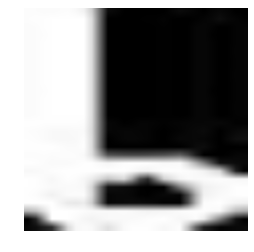

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


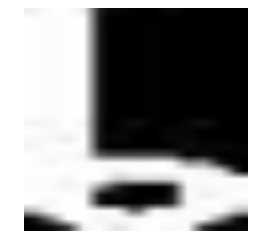

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


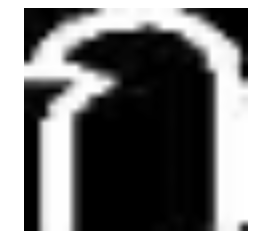

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


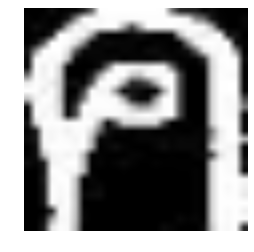

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


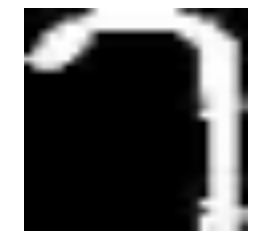

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.99%


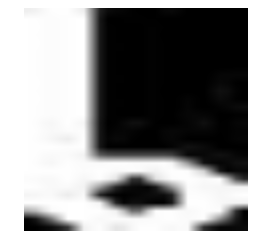

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


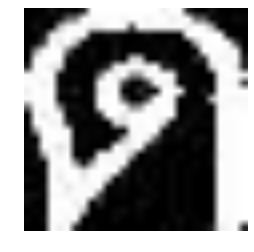

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


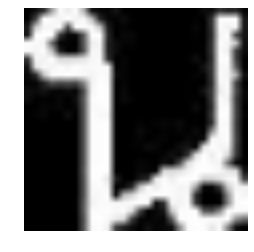

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


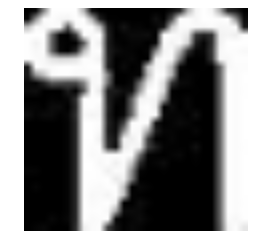

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


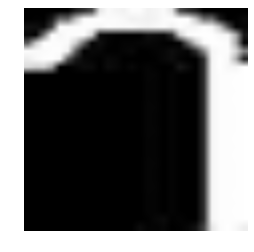

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


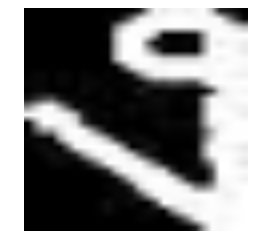

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


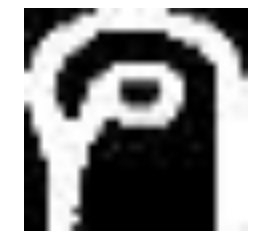

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


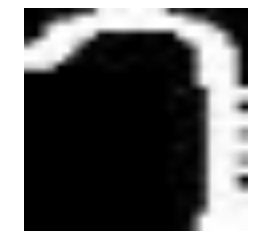

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.98%


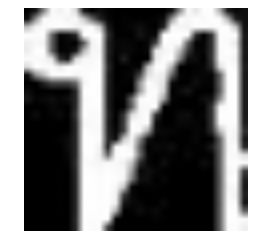

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


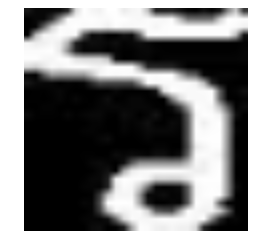

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


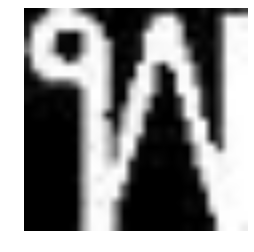

ตำแหน่ง :  155
ทำนาย :  พ
ค่าความมั่นใจ : 100.00%


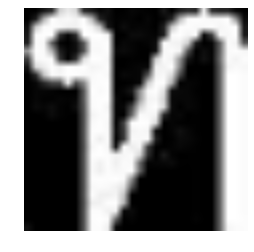

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


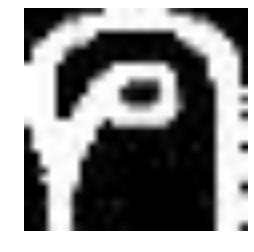

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


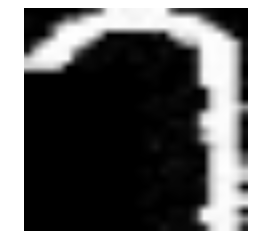

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


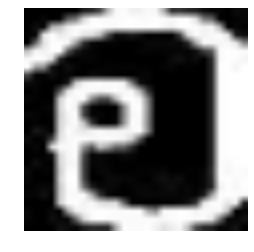

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


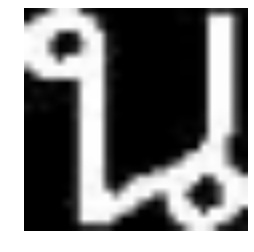

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


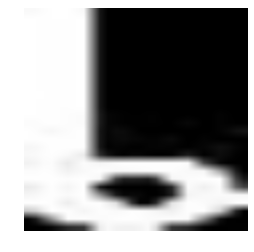

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


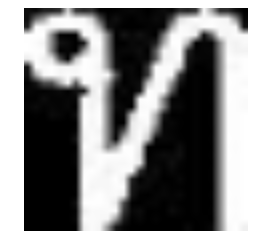

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


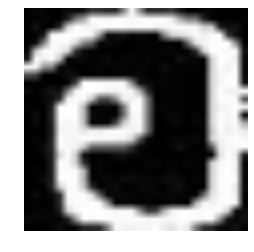

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


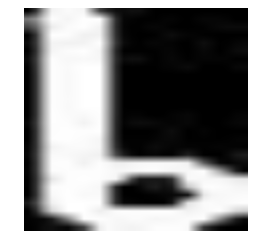

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


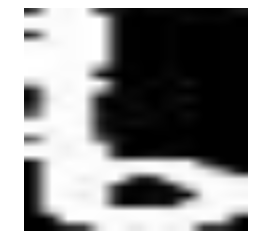

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


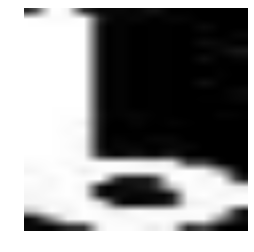

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


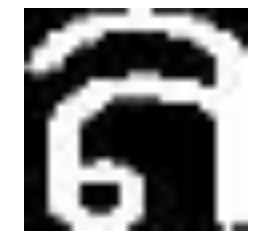

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


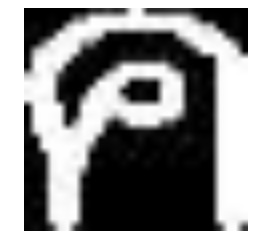

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


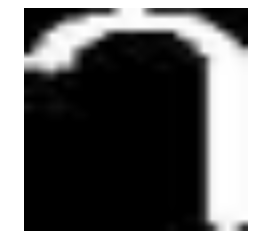

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


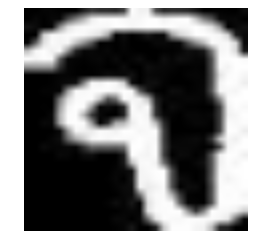

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


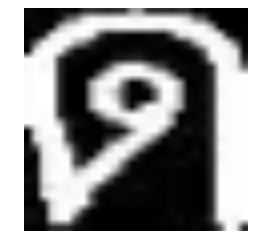

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


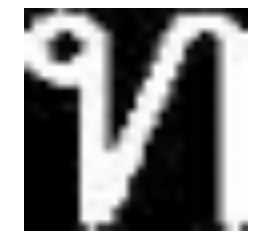

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


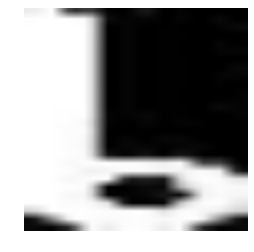

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


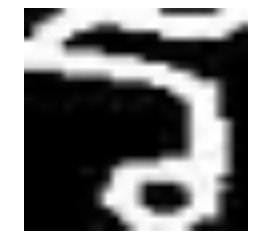

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


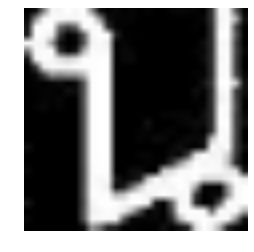

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


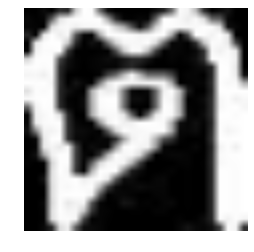

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


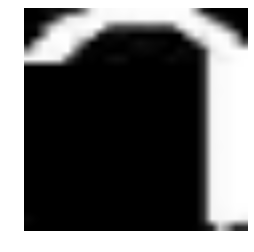

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 99.97%


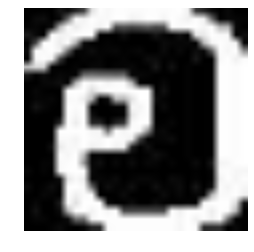

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


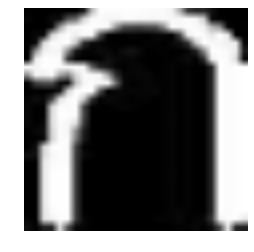

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


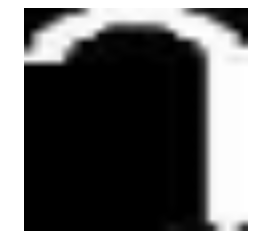

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


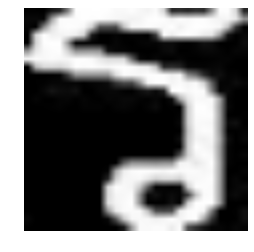

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


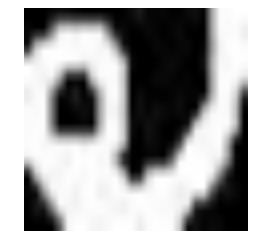

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.99%


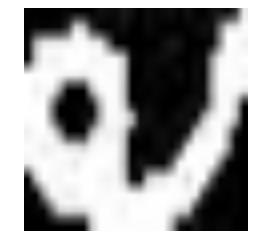

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.54%


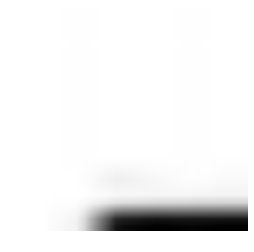

ตำแหน่ง :  70
ทำนาย :  i
ค่าความมั่นใจ : 27.95%


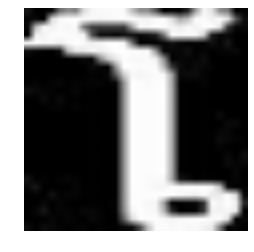

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


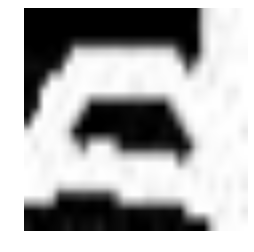

ตำแหน่ง :  178
ทำนาย :  อี(สระอี)
ค่าความมั่นใจ : 100.00%


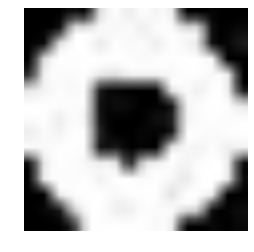

ตำแหน่ง :  202
ทำนาย :  อำ
ค่าความมั่นใจ : 100.00%


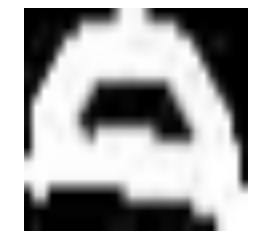

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


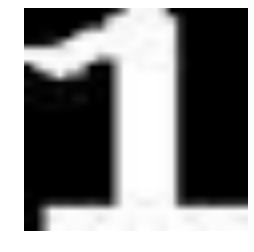

ตำแหน่ง :  14
ทำนาย :  1
ค่าความมั่นใจ : 100.00%


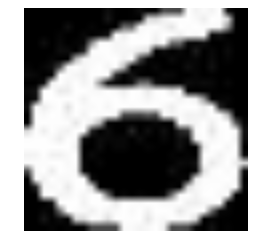

ตำแหน่ง :  19
ทำนาย :  6
ค่าความมั่นใจ : 100.00%


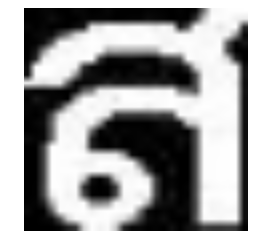

ตำแหน่ง :  284
ทำนาย :  สึ(ติด)
ค่าความมั่นใจ : 73.81%


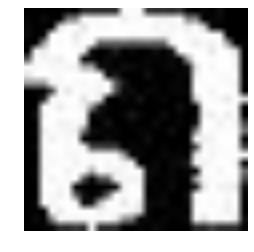

ตำแหน่ง :  147
ทำนาย :  ถ
ค่าความมั่นใจ : 100.00%


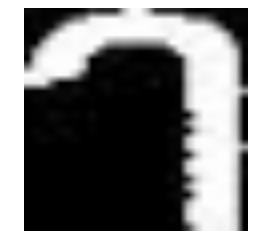

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


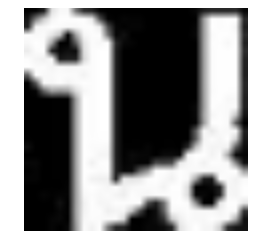

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


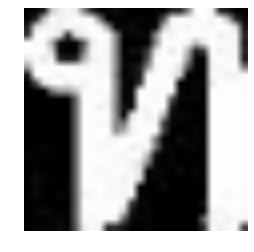

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


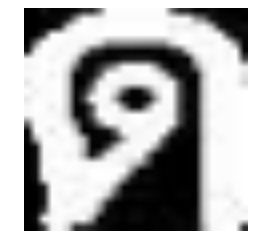

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 99.94%


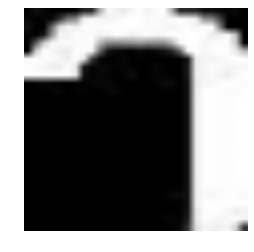

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


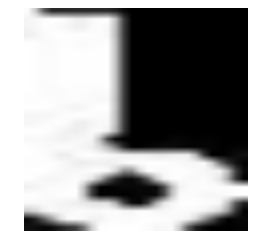

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


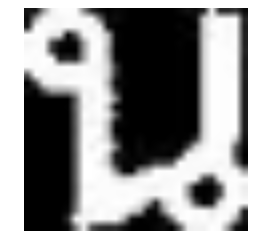

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


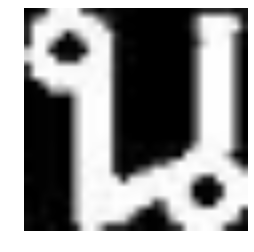

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


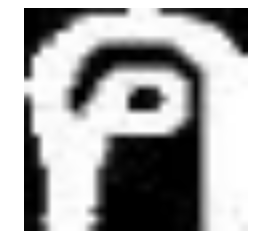

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


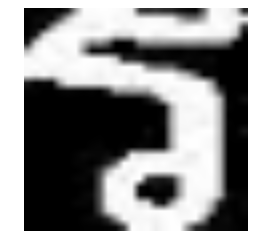

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


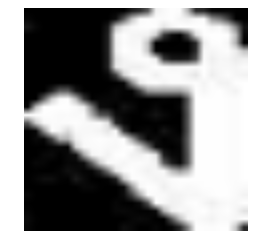

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


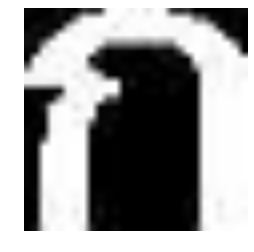

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


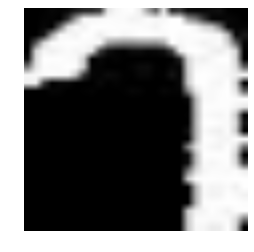

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


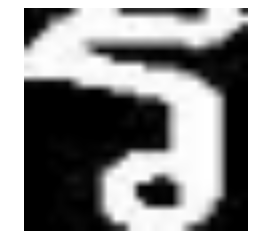

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


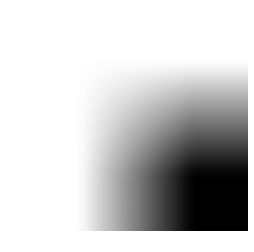

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 67.65%


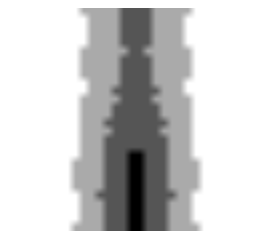

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 25.23%


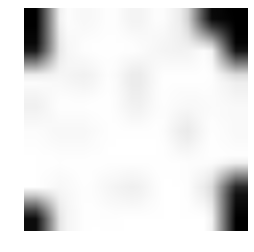

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 96.05%


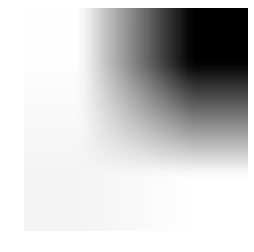

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 76.85%


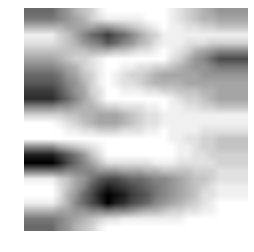

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 26.26%


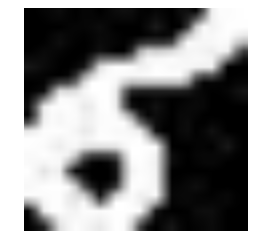

ตำแหน่ง :  201
ทำนาย :  อ์(การันต์)
ค่าความมั่นใจ : 100.00%


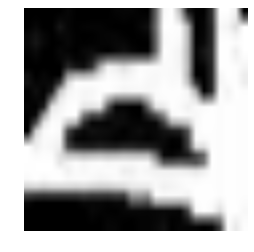

ตำแหน่ง :  180
ทำนาย :  อื(สระอือ)
ค่าความมั่นใจ : 100.00%


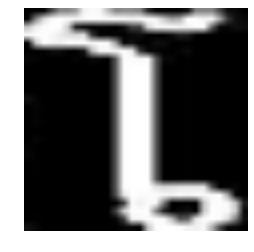

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


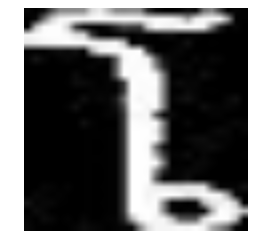

ตำแหน่ง :  191
ทำนาย :  โ
ค่าความมั่นใจ : 100.00%


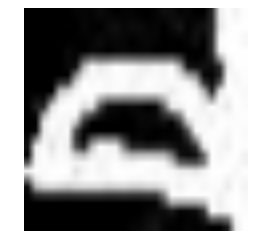

ตำแหน่ง :  178
ทำนาย :  อี(สระอี)
ค่าความมั่นใจ : 100.00%


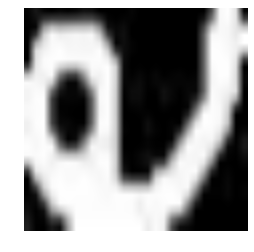

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


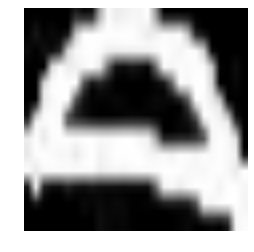

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


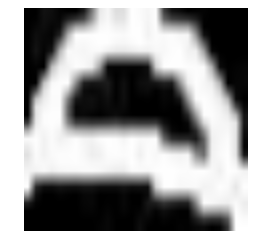

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


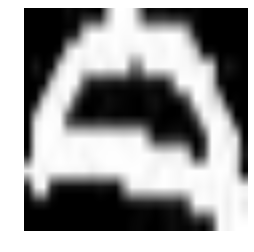

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


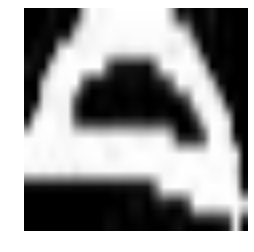

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


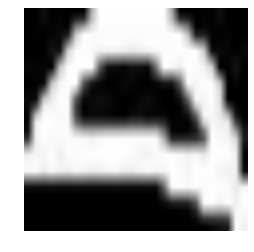

ตำแหน่ง :  177
ทำนาย :  อิ(สระอิ)
ค่าความมั่นใจ : 100.00%


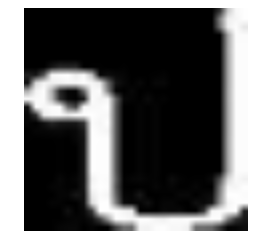

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


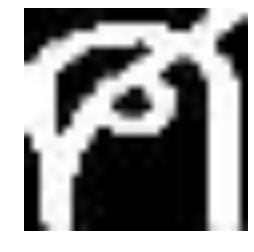

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 100.00%


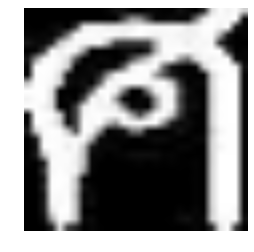

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 99.98%


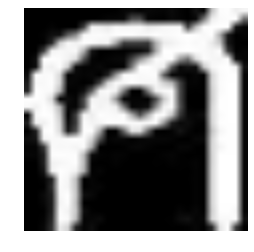

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 100.00%


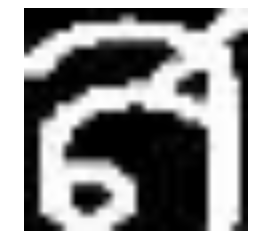

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


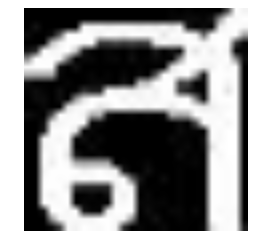

ตำแหน่ง :  167
ทำนาย :  ส
ค่าความมั่นใจ : 100.00%


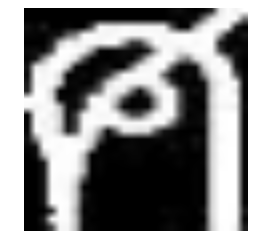

ตำแหน่ง :  165
ทำนาย :  ศ
ค่าความมั่นใจ : 100.00%


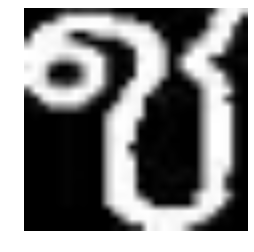

ตำแหน่ง :  135
ทำนาย :  ช
ค่าความมั่นใจ : 99.91%


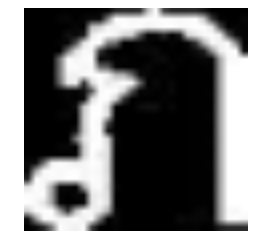

ตำแหน่ง :  157
ทำนาย :  ภ
ค่าความมั่นใจ : 100.00%


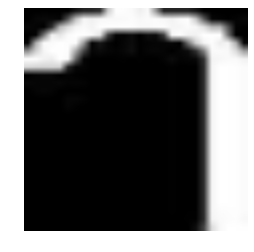

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


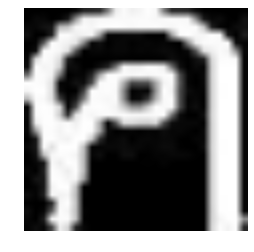

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


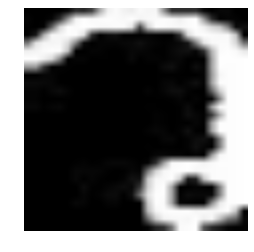

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


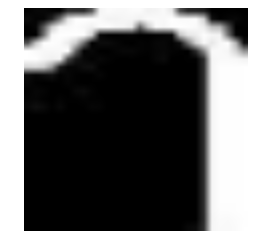

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


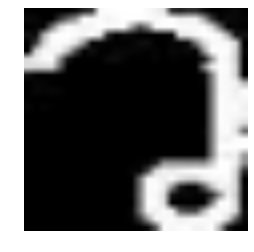

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


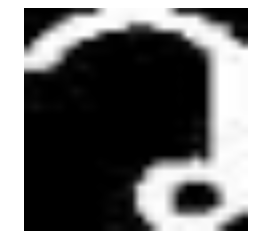

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


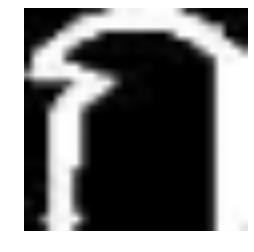

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


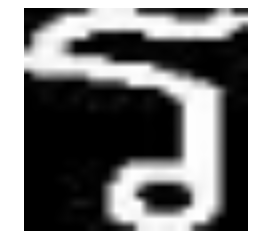

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


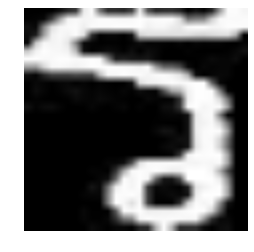

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


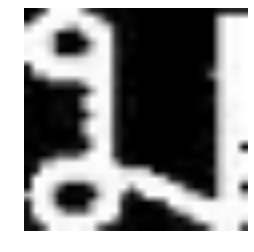

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


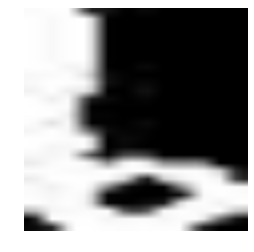

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


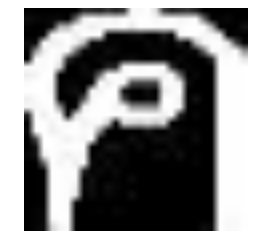

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


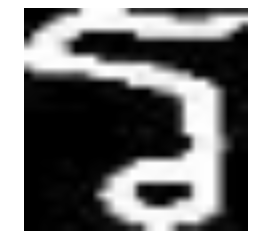

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


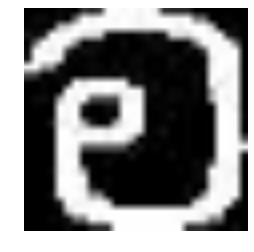

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


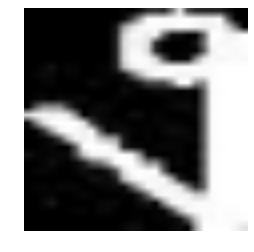

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


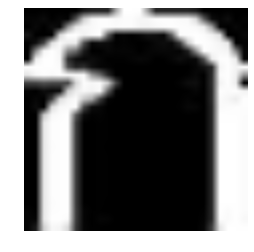

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


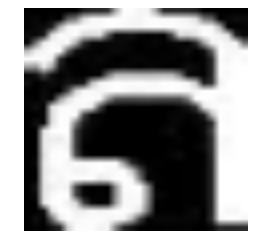

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


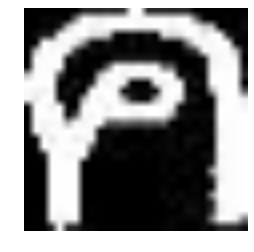

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


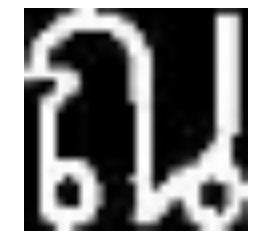

ตำแหน่ง :  144
ทำนาย :  ณ
ค่าความมั่นใจ : 100.00%


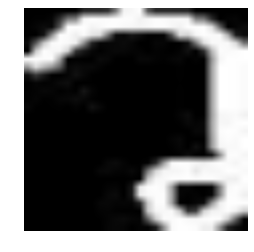

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


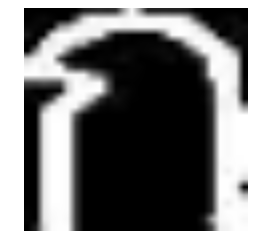

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


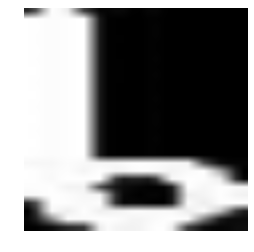

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


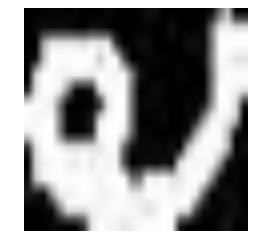

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.88%


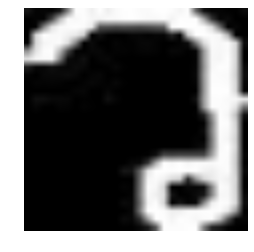

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


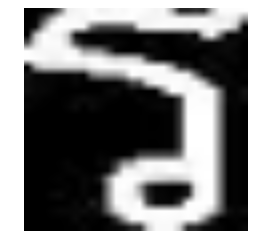

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


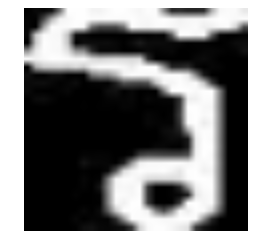

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


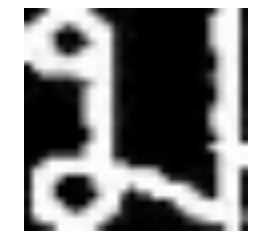

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


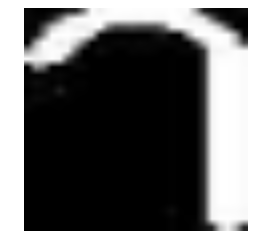

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


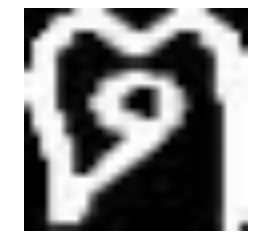

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


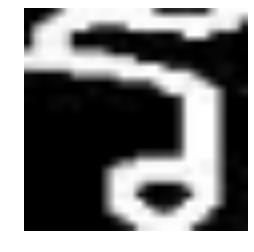

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


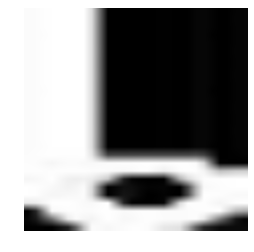

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


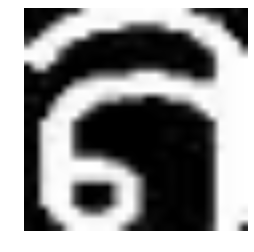

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


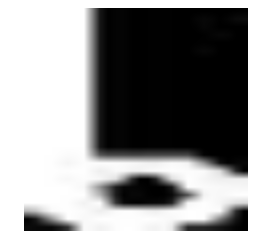

ตำแหน่ง :  189
ทำนาย :  เ
ค่าความมั่นใจ : 100.00%


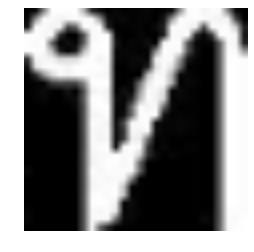

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


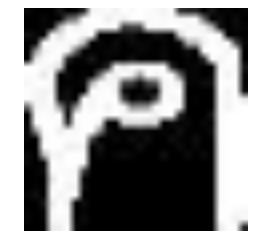

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


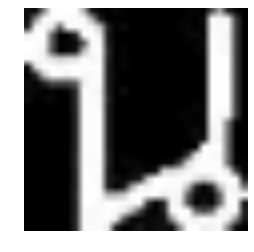

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


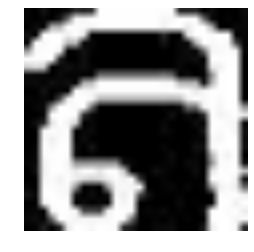

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


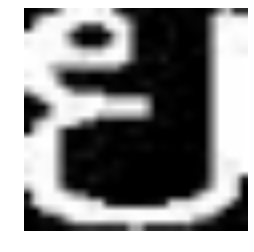

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


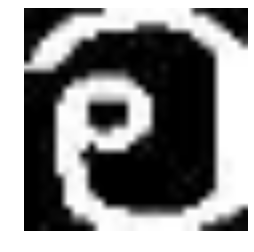

ตำแหน่ง :  170
ทำนาย :  อ
ค่าความมั่นใจ : 100.00%


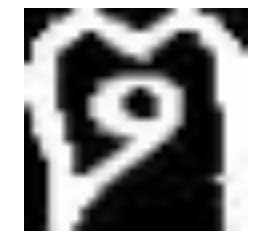

ตำแหน่ง :  146
ทำนาย :  ต
ค่าความมั่นใจ : 100.00%


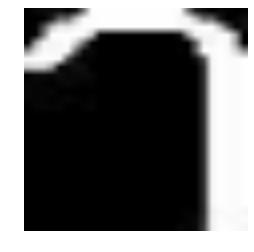

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


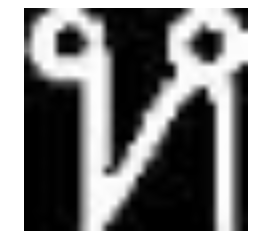

ตำแหน่ง :  168
ทำนาย :  ห
ค่าความมั่นใจ : 100.00%


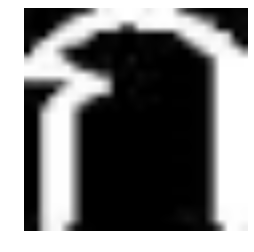

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


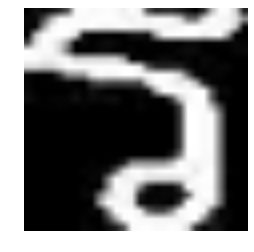

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


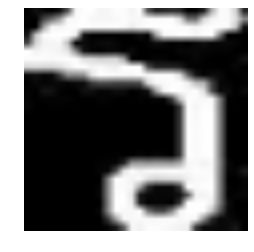

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


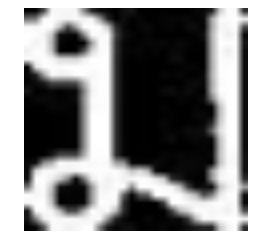

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


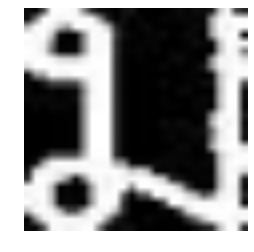

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


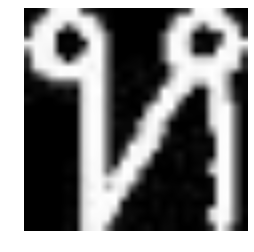

ตำแหน่ง :  168
ทำนาย :  ห
ค่าความมั่นใจ : 100.00%


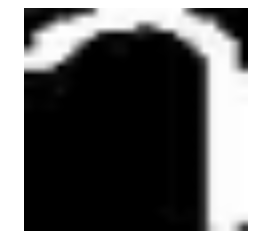

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


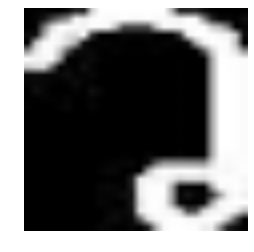

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


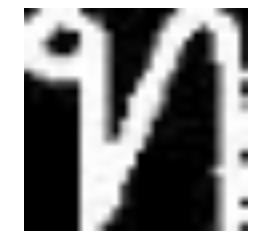

ตำแหน่ง :  148
ทำนาย :  ท
ค่าความมั่นใจ : 100.00%


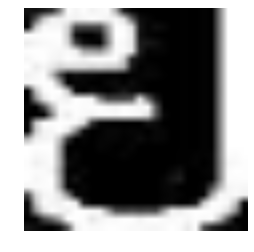

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


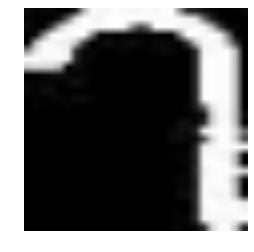

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


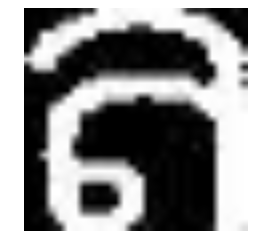

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


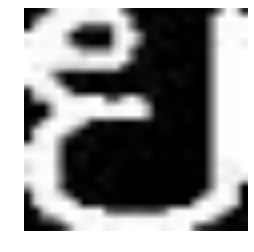

ตำแหน่ง :  159
ทำนาย :  ย
ค่าความมั่นใจ : 100.00%


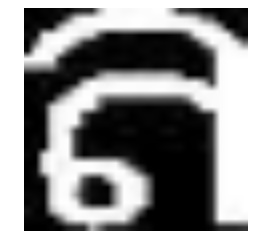

ตำแหน่ง :  162
ทำนาย :  ล
ค่าความมั่นใจ : 100.00%


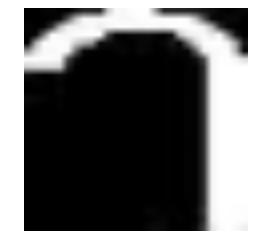

ตำแหน่ง :  175
ทำนาย :  า
ค่าความมั่นใจ : 100.00%


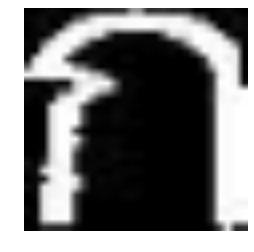

ตำแหน่ง :  126
ทำนาย :  ก
ค่าความมั่นใจ : 100.00%


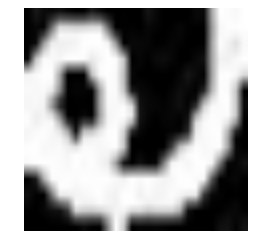

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.70%


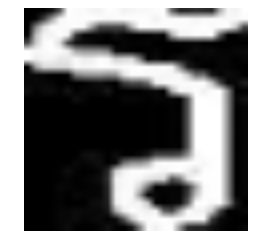

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


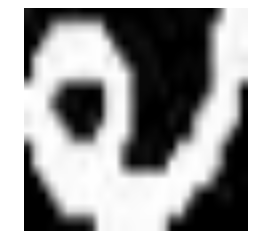

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.96%


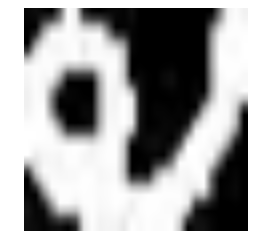

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.56%


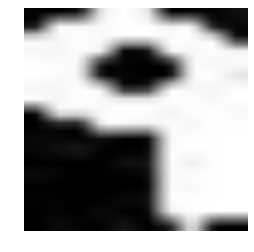

ตำแหน่ง :  181
ทำนาย :  อุ(สระอุ)
ค่าความมั่นใจ : 100.00%


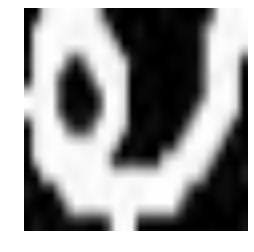

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 100.00%


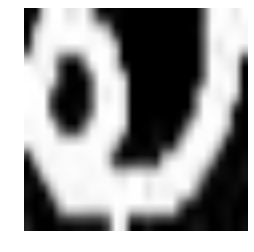

ตำแหน่ง :  174
ทำนาย :  อั(ไม้หันอากาศ)
ค่าความมั่นใจ : 99.99%


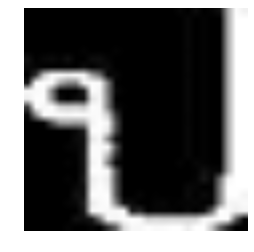

ตำแหน่ง :  152
ทำนาย :  ป
ค่าความมั่นใจ : 100.00%


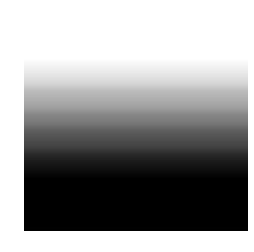

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 30.22%


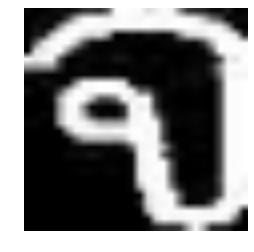

ตำแหน่ง :  133
ทำนาย :  จ
ค่าความมั่นใจ : 100.00%


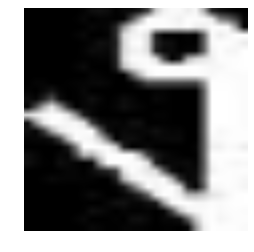

ตำแหน่ง :  132
ทำนาย :  ง
ค่าความมั่นใจ : 100.00%


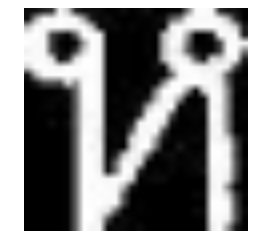

ตำแหน่ง :  168
ทำนาย :  ห
ค่าความมั่นใจ : 100.00%


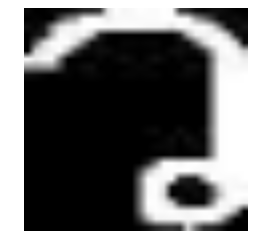

ตำแหน่ง :  164
ทำนาย :  ว
ค่าความมั่นใจ : 100.00%


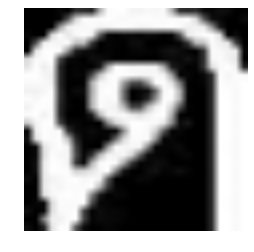

ตำแหน่ง :  145
ทำนาย :  ด
ค่าความมั่นใจ : 100.00%


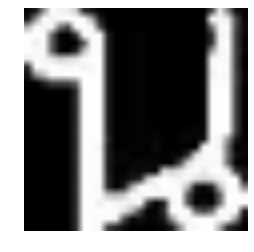

ตำแหน่ง :  150
ทำนาย :  น
ค่าความมั่นใจ : 100.00%


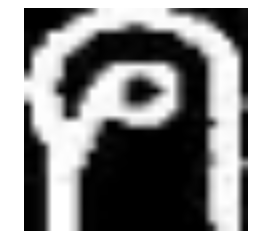

ตำแหน่ง :  129
ทำนาย :  ค
ค่าความมั่นใจ : 100.00%


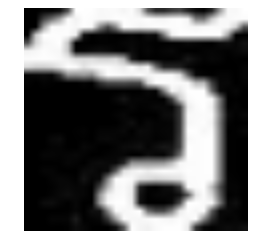

ตำแหน่ง :  160
ทำนาย :  ร
ค่าความมั่นใจ : 100.00%


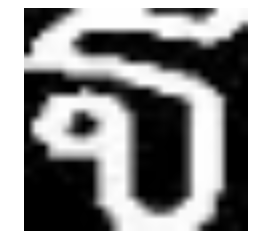

ตำแหน่ง :  141
ทำนาย :  ฐ
ค่าความมั่นใจ : 100.00%


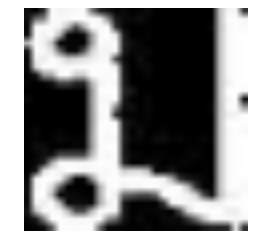

ตำแหน่ง :  158
ทำนาย :  ม
ค่าความมั่นใจ : 100.00%


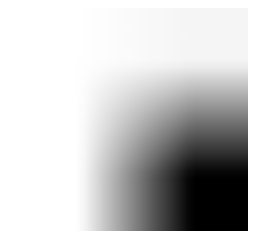

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 62.88%


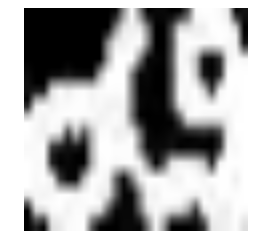

ตำแหน่ง :  7
ทำนาย :  (ดอกจันทร์)
ค่าความมั่นใจ : 60.49%


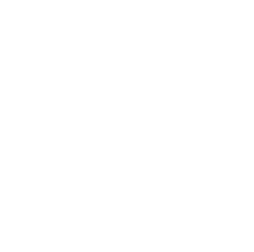

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 25.33%


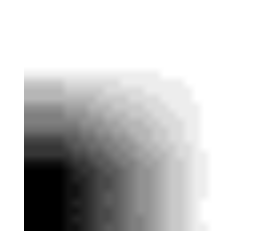

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 26.22%


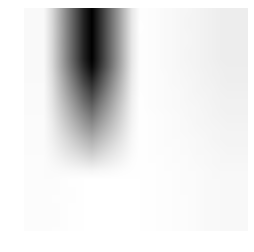

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 81.84%


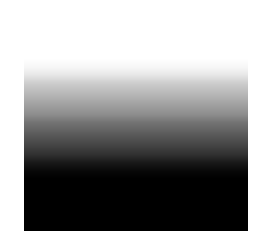

ตำแหน่ง :  10
ทำนาย :  -(ลบ)
ค่าความมั่นใจ : 34.53%


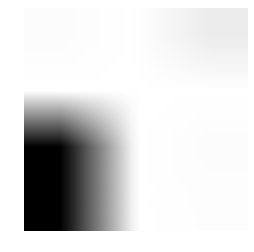

ตำแหน่ง :  181
ทำนาย :  อุ(สระอุ)
ค่าความมั่นใจ : 50.00%


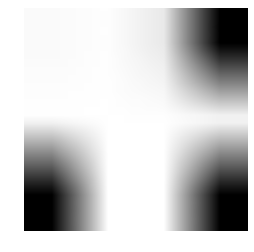

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 71.39%


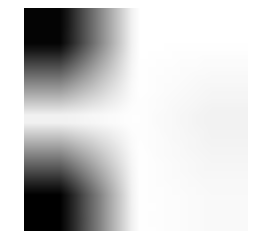

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 72.21%


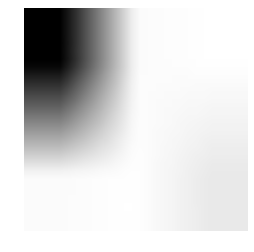

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 81.98%


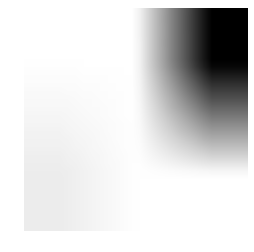

ตำแหน่ง :  11
ทำนาย :  .(จุด)
ค่าความมั่นใจ : 83.58%


In [8]:
consonant = ['#','$',' ','&','(single quote)','(',')','(ดอกจันทร์)','+',',','-(ลบ)','.(จุด)','(slash)','0','1','2','3','4','5','6','7','8','9',' ',' ','<',' ','>','?','@','A','B','C','D'
,'E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','[','(back slash)',']',' ',' ',' ','a','b','c','d'
,'e','f','g','h','i','j','k','l(แอลเล็ก)','m','n','o','p','q','r','s','t','u','v','w','x','y',' ','{','(ขีดตั้ง)','}',' ',' ',' ',' ',' ',' '
,' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ',' ','ก', 'ข', 'ฃ', 'ค'
,'ฅ', 'ฆ', 'ง', 'จ', 'ฉ', 'ช', 'ซ', 'ฌ', 'ญ', 'ฎ', 'ฏ', 'ฐ', 'ฑ', 'ฒ', 'ณ', 'ด', 'ต', 'ถ', 'ท', 'ธ', 'น', 'บ'
, 'ป', 'ผ', 'ฝ', 'พ', 'ฟ', 'ภ', 'ม', 'ย', 'ร','ฤ(ตัวรึ)', 'ล', 'ฦ(ตัวลึ)', 'ว', 'ศ', 'ษ', 'ส', 'ห', 'ฬ', 'อ', 'ฮ','ฯ',' ','อั(ไม้หันอากาศ)'
,'า',' ','อิ(สระอิ)','อี(สระอี)','อึ(สระอึ)','อื(สระอือ)','อุ(สระอุ)','อู(สระอู)',' ',' ',' ',' ',' ','฿','เ',' ','โ','ใ','ไ','ๅ(ลากข้าง)','ๆ','อ็','อ่(ไม้เอก)','อ้(ไม้โท)',
'อ๊(ไม้ตรี)','อ๋(ไม้จัตวา)','อ์(การันต์)','อำ',' ',' ','๐(ศูนย์ไทย)','๑','๒','๓','๔'
,'๕','๖','๗','๘','๙',' ',' ',' ',' ',' ',' ','ญ(ติด)','ฐ(ติด)','สั(ติด)','ป็(ติด)','ปั(ติด)',' ป้(ติด)','ฟั(ติด)'
,'ฟ้(ติด)','ฝั(ติด)','ฝ้(ติด)','อี่(ติด)','อี้(ติด)','อื่(ติด)','อื้(ติด)','อึ่(ติด)','อึ้(ติด)','อ้โ(ติด)','อ้ใ(ติด)','อ้ไ(ติด)'
,'อ์โ(ติด)','อ์ใ(ติด)','อ์ไ(ติด)','อ็ไ(ติด)','สิ(ติด)','สี(ติด)','สื(ติด)','ส้(ติด)','ศื(ติด)','ศี(ติด)','ศั(ติด)','ชี(ติด)','ชื(ติด)','ชั(ติด)','ช็(ติด)',
'ชโ(ติด)','ชไ(ติด)','ชใ(ติด)','ซี(ติด)','ซื(ติด)','ซึ(ติด)','ปิ(ติด)','ปี(ติด)','ปื(ติด)','ปโ(ติด)','ปไ(ติด)','ปใ(ติด)','ฝี(ติด)','ฝึ(ติด)','ฝื(ติด)',
'ฝใ(ติด)','ฟิ(ติด)','ฟื(ติด)','ฟโ(ติด)','ฟไ(ติด)','ฟใ(ติด)','อีโ(ติด)','อีไ(ติด)','อีใ(ติด)','อ่โ(ติด)','อ่ไ(ติด)','อ่ใ(ติด)','ศิ(ติด)','ศึ(ติด)',
'สึ(ติด)','สั(ติด)']

count_arr = 0
sum_arr = 0

row = 0
col = 0

data_set = []
i = 0


for i in range(len(pred)):
    
    plt.imshow(img_data[i].reshape(28,28), cmap="gray_r")
    plt.axis('off')
    plt.show()

    #folder_path = "C:/xampp/htdocs/DeepOCR/"+name
    file_names = next(os.walk(folder_path))
     
    image_path = file_names[0] + "/" + file_names[2][i]
    
    
    #index = image_path.find('DeepOCR')
   
    #str_path ="http://localhost/"+image_path[index:]
    
    print("ตำแหน่ง : ",pred[i])
    #worksheet.write(row, col, pred[i])
        
    for cons in range (0,286):
        if(cons == pred[i]):
            c = pred[i]
    print("ทำนาย : ", consonant[c])
    #worksheet.write(row, col + 1, consonant[c])
    
    
    single_sample_prob = [predictor.eval(img_data[i])]
   
    sum_single = sum(single_sample_prob[0][0])
   
    max_eval = np.max(single_sample_prob)
    
    loss = -math.log(max_eval/sum_single)
   
    per = format((max_eval * 100),'.2f')
    print("ค่าความมั่นใจ :" + " "+str(per)+"%")
    #worksheet.write(row, col + 2, str(per))
    
    #insert_data(name,pred[i],consonant[c],str(per)+"%",str_path)
    
    row = row + 1


#workbook.close()

# Classification 

In [9]:
j = 0
k = 1

base_folder = "D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/"+name #เปลี่ยนชื่อเอา
folder_path = base_folder + "/" +name
file_names = next(os.walk(folder_path)) 
print(len(file_names[2]))

for i in range(len(pred)):
    
    image_path = file_names[0] + "/" + file_names[2][i]
    #print(image_path)
    
    for cons in range (0,286):
        if(cons == pred[i]):
            c = pred[i]+35
            
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            output_classify_folder = base_folder + "/classify_"+ str(c) + "/"
            
            try:
                os.mkdir(output_classify_folder)
            except OSError as exc:
                print("folder " + output_classify_folder + " exists")
            
            output_classify = output_classify_folder + str(k) + ".bmp"
            print(output_classify)
            j = j+1
            k = k+1
            cv2.imwrite(output_classify,img)
            
#print(j)

550
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_46/1.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_45/2.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_232/3.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_236/4.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_228/5.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_233/6.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_226/7.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_213/8.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_209/9.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_232/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_232/10.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_187/11.bmp
D:/cntk1.1/Exam

folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_199/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_199/78.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_168/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_168/79.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_194/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_194/80.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_224/81.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_185/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_185/82.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_162/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_162/83.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Databa

D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_170/172.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/173.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_193/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_193/174.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/175.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_195/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_195/176.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_182/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_182/177.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-

D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_48/266.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_79/267.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_79/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_79/268.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_180/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_180/269.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/270.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_224/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_224/271.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_185/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/Ne

D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_209/350.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_237/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_237/351.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_212/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_212/352.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_212/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_212/353.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_170/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_170/354.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_200/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_200/355.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-

folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/411.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_195/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_195/412.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_209/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_209/413.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_209/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_209/414.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_105/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_105/415.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_226/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-

folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_194/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_194/500.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_205/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_205/501.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_181/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_181/502.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_210/503.bmp
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_203/504.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_161/ exists
D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-Database/NewData/classify_161/505.bmp
folder D:/cntk1.1/Examples/Image/DataSets/MNIST/OCR-